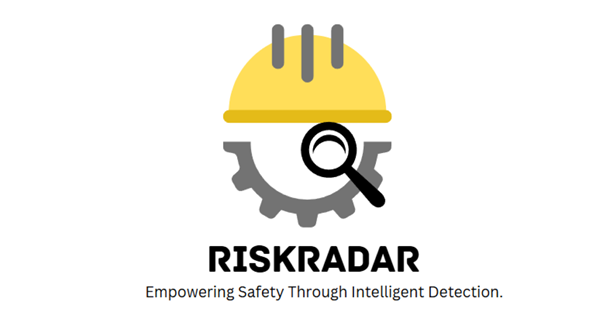


# **RiskRadar**
Shahd Alfahad	443200491

Shdan Alsheddi	443203081

Shaden Albader 	443200524

Hend Al Ghamdi 	443200868


---



## Motivation


---

Construction sites are among the most hazardous work environments, with a significant risk of accidents
and injuries due to falling objects, machinery, and other dangers. Ensuring that workers adhere to safety
protocols by wearing appropriate Personal Protective Equipment (PPE) such as helmets, gloves, safety
vests, and goggles is crucial for mitigating these risks. However, traditional methods of monitoring PPE
compliance often rely on manual inspections, which can be inconsistent and labor-intensive. There is a
pressing need for automated systems that can efficiently and accurately monitor PPE usage in real time to
enhance safety and ensure regulatory compliance.

The goal of this project is to develop an automated system that can identify whether employees are
wearing the necessary safety gear, such as hardhat and vests, gloves, mask ,by analyzing images taken at
the workplace and construction sites.

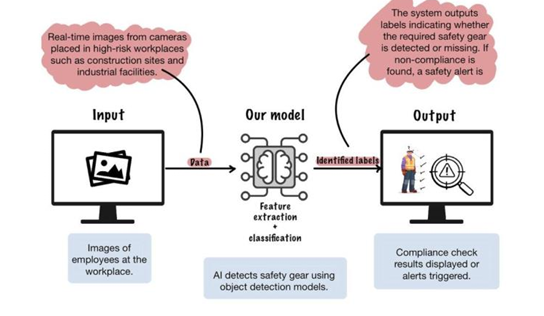

# Overview


---
In this project we aim to train the Yolo11 model to detect PPE (Personal Protective Equipment) using dataset from [Roboflow](https://universe.roboflow.com/roboflow-universe-projects/construction-site-safety)

Labels in this dataset:

0: Hardhat

1: Mask

2: NO-Hardhat

3: NO-Mask

4: NO-Safety Vest

5: Person

6: Safety Cone

7: Safety Vest

8: Machinery

9: Vehicle

More info:
Number of classes: 10

Label Annotation: YOLO format (.txt)
[class_id, center_x, center_y, width, height]


In this project, we started by implementing an SVM model as a baseline to evaluate the dataset, providing initial insights into classification performance. We then transitioned to YOLOv11, a deep-learning-based model, to address the limitations of the SVM and improve object detection capabilities. To further optimize YOLOv11, we applied hyperparameter tuning using grid search, experimenting with combinations of learning rates, epochs, and batch sizes. This systematic approach allowed us to enhance the model’s accuracy and robustness, particularly for detecting challenging examples within the dataset.





---


 Note: The SVM implementation, including its code and output, is
documented in a separate notebook for clarity and better organization. This notebook focuses on the YOLOv11 implementation and enhancements

## Installing and importing dependencies 📚

----

We'll import the following libraries for EDA, visualizations, and YOLO11n training:

-Basic Operations and Data Handling:

- os and glob: For accessing and navigating file directories.

- numpy: For array operations.

- pandas: For working with dataframes and creating metadata.

-Image Processing and Visualizations:

- PIL (from PIL import Image): For handling image operations.

- cv2: OpenCV library for image operations and visualization.

- matplotlib.pyplot: For plotting results and visualizations of class distributions.



-Object Detection with YOLO11n:

- ultralytics.YOLO: For training and evaluating the YOLO object detection model.

-Additional Libraries for YOLO Training and Tuning:

 - datetime: For managing timestamps during model training and result logging.

- json: For saving and loading results in JSON format.

- pathlib.Path: For structured file and directory handling.

- torch: For managing computations and utilizing GPU acceleration.

- gc: For clearing GPU memory between training runs.

- sklearn.model_selection.ParameterGrid: For performing grid search on hyperparameter combinations.


In [ ]:
!pip install ultralytics --upgrade
!pip install -U ipywidgets
!pip install ffmpeg-python
!pip install roboflow
!wandb disabled


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
W&B disabled.


In [ ]:
from ultralytics import YOLO
import os
import glob
from pathlib import Path
from roboflow import Roboflow
import matplotlib.pyplot as plt
import numpy as np
import yaml
import torch
import cv2
import random
import seaborn as sns
import pandas as pd
from sklearn import svm
from sklearn.metrics import accuracy_score, classification_report
from PIL import Image
from IPython.display import HTML, display, Image
from base64 import b64encode
from datetime import datetime
import json
import gc
from sklearn.model_selection import ParameterGrid


np.random.seed(12345)
%matplotlib inline


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Roboflow Dataset Integration

In [ ]:
rf = Roboflow(api_key="XbLHspFnwkXyuxgTOeVJ")
project = rf.workspace("roboflow-universe-projects").project("construction-site-safety")
version = project.version(28)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Construction-Site-Safety-28 in yolov11:: 100%|██████████| 5614/5614 [00:00<00:00, 6432.49it/s]


### Define Paths and Parameters

In [ ]:
dataset_path = dataset.location
INPUT_DIR =dataset_path
WORK_DIR = '/content/RiakRadar/'
os.makedirs(WORK_DIR, exist_ok=True)

In [ ]:
# Number of classes and their names
num_classes = 10
classes = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']

# Exploratory Data Analysis (EDA)
We will first do an exploratory data analysis on the CSS Dataset and try to see the distribution of train, valid and test sets. We will also visualize the samples, and run a custom object detection model to detect one of the following PPE classes:

['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']

In [ ]:
# Count Images
dataset_path = dataset.location
for subset_folder in ['train', 'valid', 'test']:
    subset_images = glob.glob(os.path.join(dataset_path, subset_folder, 'images','*.jpg'))
    print(f"Number of {subset_folder} images:", len(subset_images))


Number of train images: 2605
Number of valid images: 114
Number of test images: 82


In [ ]:
# Create Dataset YAML
dict_file = {'train': os.path.join(INPUT_DIR, 'train'),
             'val': os.path.join(INPUT_DIR, 'valid'),
             'test': os.path.join(INPUT_DIR, 'test'),
             'nc': num_classes,
             'names': classes
            }

with open(os.path.join(WORK_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)


In [ ]:
# Calculate Class Distribution
class_idx = {str(i):classes[i] for i in range(num_classes)}

class_stat = {}
data_len = {}

for mode in ['train', 'valid', 'test']:

    class_count = {classes[i]:0 for i in range(num_classes)}

    path = os.path.join(INPUT_DIR, mode, 'labels')

    for file in os.listdir(path):

        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

# Bar chart

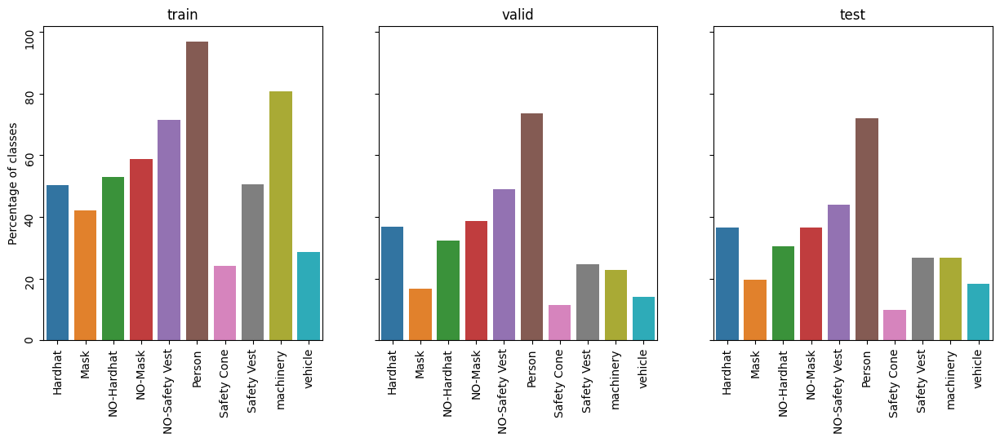

In [ ]:
# Visualize Class Distribution

fig, ax = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(pd.DataFrame({mode: class_stat[mode]}).T / data_len[mode] * 100, ax=ax[i])
    ax[i].set_title(mode)
    ax[i].tick_params(rotation=90)
    ax[i].set_ylabel('Percentage of classes')
plt.show()


Every bar chart represents the number of instances for each class within the train, validation and test sets. We can see that 'Person' class is the major class, and 'Safty_cone' class is the minority class with the fewest instances in all sets.

# Pie chart

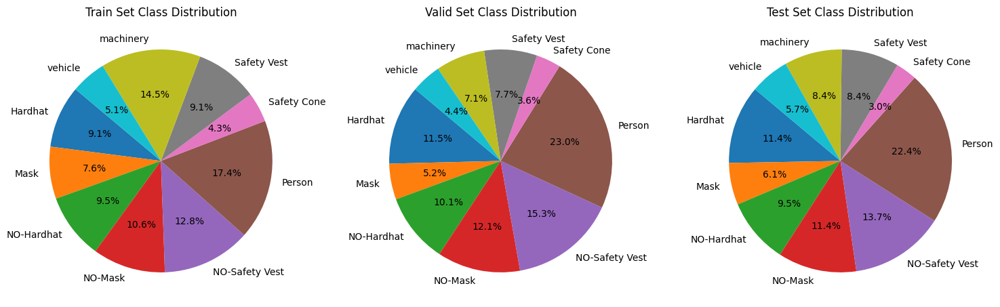

In [ ]:
# Visualize Class Distribution with Pie Charts

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

for i, mode in enumerate(['train', 'valid', 'test']):
    class_counts = list(class_stat[mode].values())
    class_labels = list(class_stat[mode].keys())
    ax[i].pie(class_counts, labels=class_labels, autopct='%1.1f%%', startangle=140)
    ax[i].set_title(f'{mode.capitalize()} Set Class Distribution')

plt.tight_layout()
plt.show()


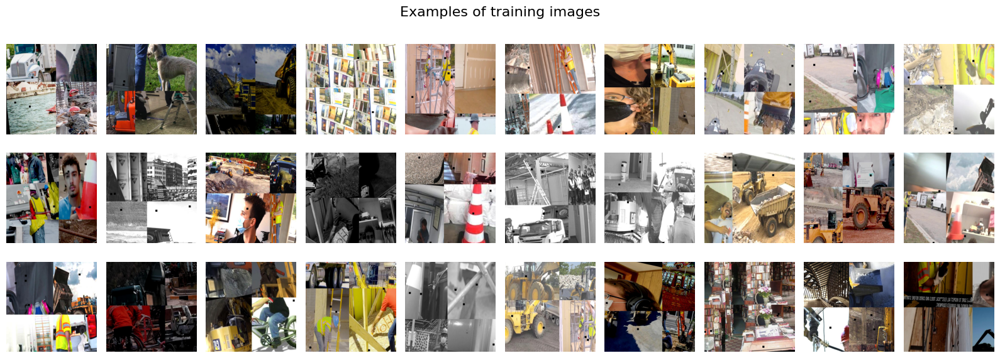

In [ ]:
# Display Sample Training Images

test_imgs_with_pred = glob.glob(os.path.join(INPUT_DIR, 'train', 'images','*.jpg'))

fig, axes = plt.subplots(3, 10, figsize=(16,6))
fig.suptitle('Examples of training images', fontsize=16)


# Randomly select 15 images
selected_images = random.sample(test_imgs_with_pred, 30)

for i, ax in enumerate(axes.flatten()):
    image = cv2.imread(selected_images[i])
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax.imshow(image)
    ax.axis("off")

plt.tight_layout()
plt.show()


We can notice that there are some tiny black rectangles on most of the training images and this is because one of the augmentation techniques used for this dataset is random crop between 0 and 20% for each image


#  Train YOLO11n Model


---


The plan is to initially train the YOLO model without any hyperparameter tuning to establish a performance baseline. This approach allows us to evaluate the model’s default capabilities. Following this, we’ll conduct a systematic hyperparameter tuning process using grid search, focusing on optimizing key parameters such as learning rate, number of epochs, and batch size. This two-step process ensures we understand the base performance first, then explore improvements through careful parameter adjustments to enhance detection accuracy.


---



`epochs=10` : providing a basic benchmark without overfitting.

`batch=32` : A batch size of 32 is a reasonable choice, balancing memory usage and model update frequency.

In [ ]:
from ultralytics import YOLO

# Load YOLO model
model = YOLO("yolo11n.pt")

# Train YOLO model with specified parameters
model.train(
    data=os.path.join(WORK_DIR, 'data.yaml'),
    epochs=10,
    batch=32,
    imgsz=640
)


100%|██████████| 5.35M/5.35M [00:00<00:00, 239MB/s]


Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/RiakRadar/data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 100MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/Construction-Site-Safety-28/train/labels... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:02<00:00, 1108.15it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed


train: New cache created: /content/Construction-Site-Safety-28/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/Construction-Site-Safety-28/valid/labels... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<00:00, 1086.85it/s]

val: New cache created: /content/Construction-Site-Safety-28/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.18G      1.434      3.293      1.502        174        640: 100%|██████████| 82/82 [00:16<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        114        697      0.669      0.195      0.297      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       5.7G      1.389      2.006      1.469        181        640: 100%|██████████| 82/82 [00:12<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all        114        697      0.542      0.438      0.467      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.53G      1.335      1.711      1.428        177        640: 100%|██████████| 82/82 [00:11<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all        114        697      0.585      0.449      0.469      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.38G      1.301        1.6      1.406        241        640: 100%|██████████| 82/82 [00:11<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all        114        697      0.638      0.467      0.501      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.41G      1.258      1.473       1.37        131        640: 100%|██████████| 82/82 [00:11<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]

                   all        114        697      0.729      0.539      0.593      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.74G      1.208      1.365      1.341        193        640: 100%|██████████| 82/82 [00:11<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all        114        697      0.716      0.556      0.605        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.06G      1.171      1.274      1.312        122        640: 100%|██████████| 82/82 [00:11<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.16it/s]

                   all        114        697      0.758      0.562      0.637      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.99G      1.134      1.202      1.282        202        640: 100%|██████████| 82/82 [00:11<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all        114        697      0.833      0.614      0.706      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.66G      1.101      1.142      1.257        137        640: 100%|██████████| 82/82 [00:11<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all        114        697       0.79      0.638      0.689      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.99G      1.063      1.084      1.232        171        640: 100%|██████████| 82/82 [00:11<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]

                   all        114        697      0.789      0.639      0.702      0.368



10 epochs completed in 0.040 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]


KeyboardInterrupt: 

# Evaluation of Yolo11 model(baseline)


---



In [ ]:
# Evaluate YOLOv8X model
metrics = model.val()
print("YOLOv11n Evaluation Metrics:", metrics)


Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.00it/s]


                   all        114        697      0.847       0.61      0.689      0.365
               Hardhat         42         79      0.942      0.734      0.834      0.489
                  Mask         19         21      0.971       0.81      0.817      0.462
            NO-Hardhat         37         69       0.88      0.478      0.565      0.254
               NO-Mask         44         74      0.891      0.378      0.496      0.198
        NO-Safety Vest         56        106      0.759      0.509       0.58      0.288
                Person         84        166      0.792      0.699      0.769      0.386
           Safety Cone         13         44      0.795      0.682       0.73      0.354
           Safety Vest         28         41          1       0.63      0.829       0.42
             machinery         26         55      0.789       0.75      0.822      0.513
               vehicle         16         42      0.649      0.429       0.45      0.282
Speed: 0.3ms preproce

**Precision (B): 0.84 (84.49%)**:
The model has a high precision rate, indicating that when it predicts a safety item/person, it's correct 84.49% of the time


---
**Recall (B): 0.61 (60.59%)**:
The model detects 60.59% of all safety items/persons present.it shows moderate performance in detecting all relevant objects.We could further enhance the model's performance by training for more epochs

---
**mAP50 (B): 0.69 (68.75%)**:
Good overall detection accuracy when using a 50% overlap criterion

---
**mAP50-95 (B): 0.36 (36.36%)**:
This lower score across varying IoU thresholds suggests that while the model performs well at lower thresholds, its performance drops with stricter evaluation criteria, indicating potential issues with detection accuracy.


---
Fitness Score: 0.40 (39.60%):
his overall fitness score reflects a balance of precision, recall, and mAP, suggesting moderate performance.




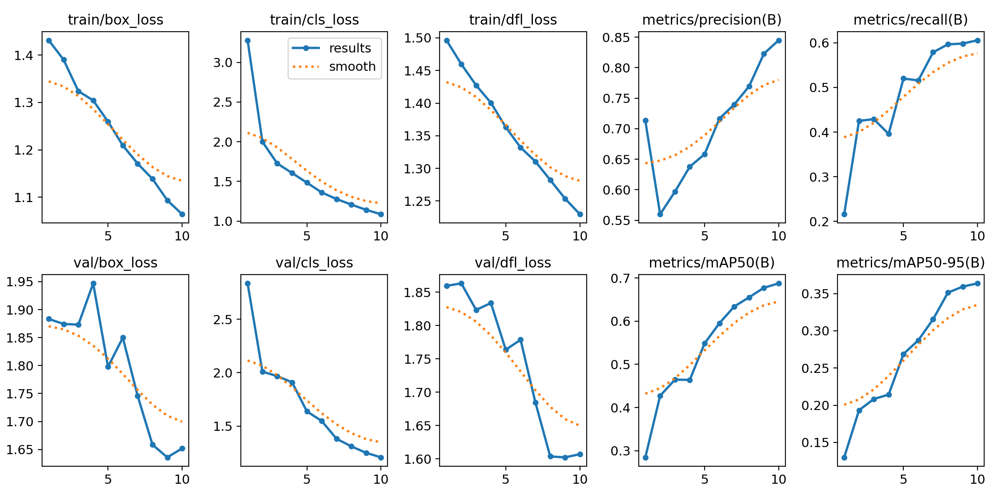

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=900)


The loss function in YOLO consists of three main components:` box loss`,` class loss (cls loss)`, and objectness `loss (dfl loss)`.
The total loss in YOLO is a combination of these three components
Box loss:

The `box loss` measures how accurately the predicted bounding box coordinates match the ground truth bounding box.
Is typically computed using a regression loss, such as Mean Squared Error (MSE), between the predicted bounding box coordinates (center coordinates, width, and height) and the ground truth bounding box coordinates.


`Class loss (cls):`

The class loss measures how well the predicted class probabilities match the true class labels.
The class loss is usually computed using a categorical cross-entropy loss, which penalizes the difference between the predicted class probabilities and the true class labels.

`Objectness loss (dfl):`

Distribution Focal Loss
YOLO predicts an "objectness" score for each bounding box, indicating the presence of an object within the grid cell. This score helps filter out irrelevant bounding boxes.
The objectness loss is calculated based on the difference between the predicted objectness score and the ground truth objectness label. It penalizes the model for false positives and false negatives in predicting the presence of an object.

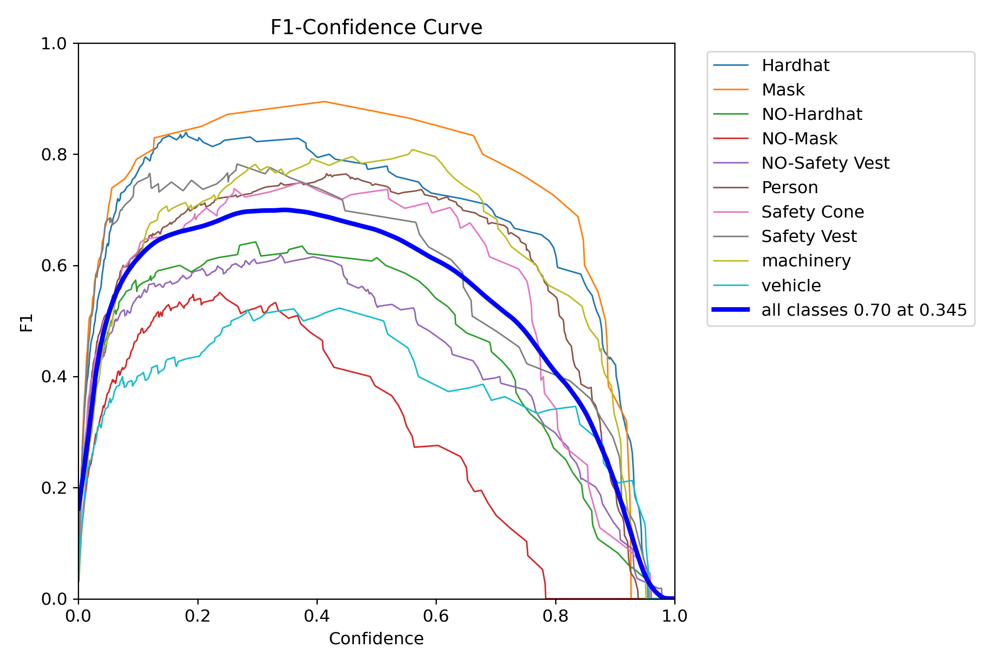

In [ ]:
Image(filename=f'/content/runs/detect/train2/F1_curve.png', width=900)

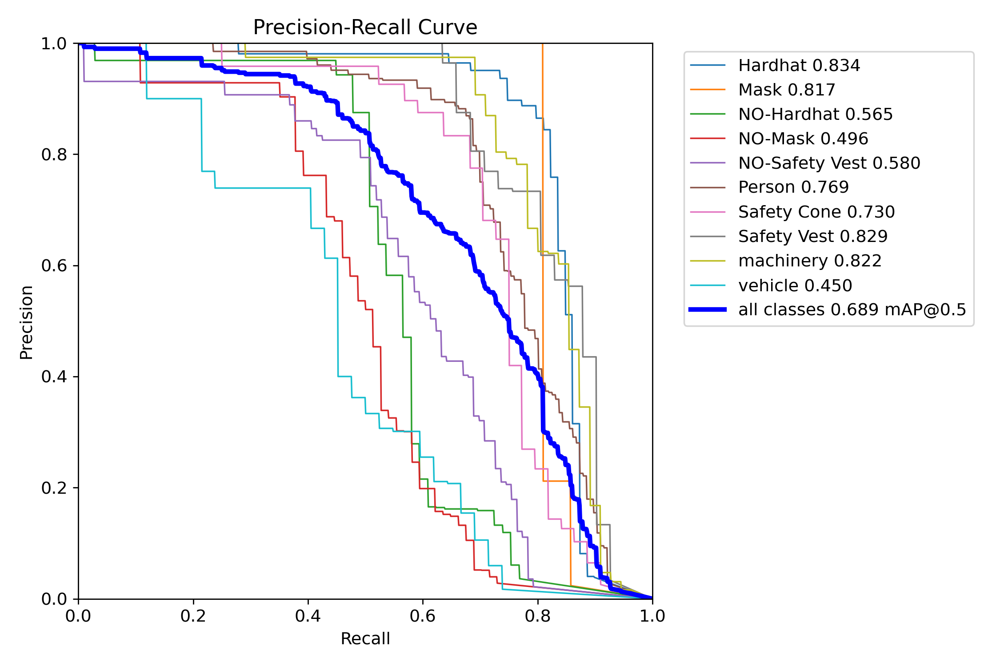

In [ ]:
Image(filename=f'/content/runs/detect/train2/PR_curve.png', width=900)

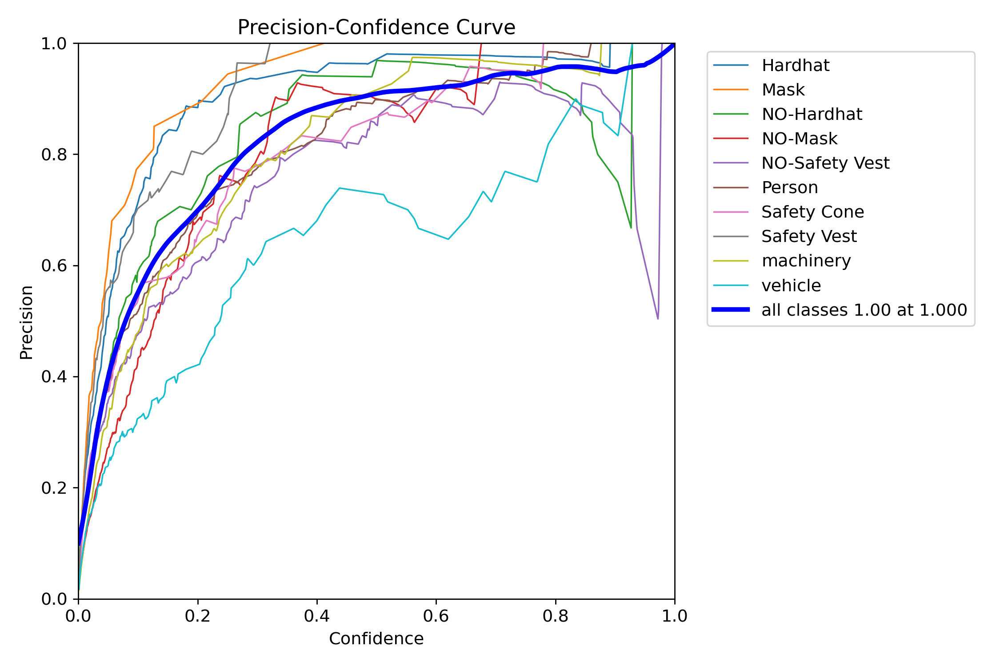

In [ ]:
Image(filename=f'/content/runs/detect/train2/P_curve.png', width=900)

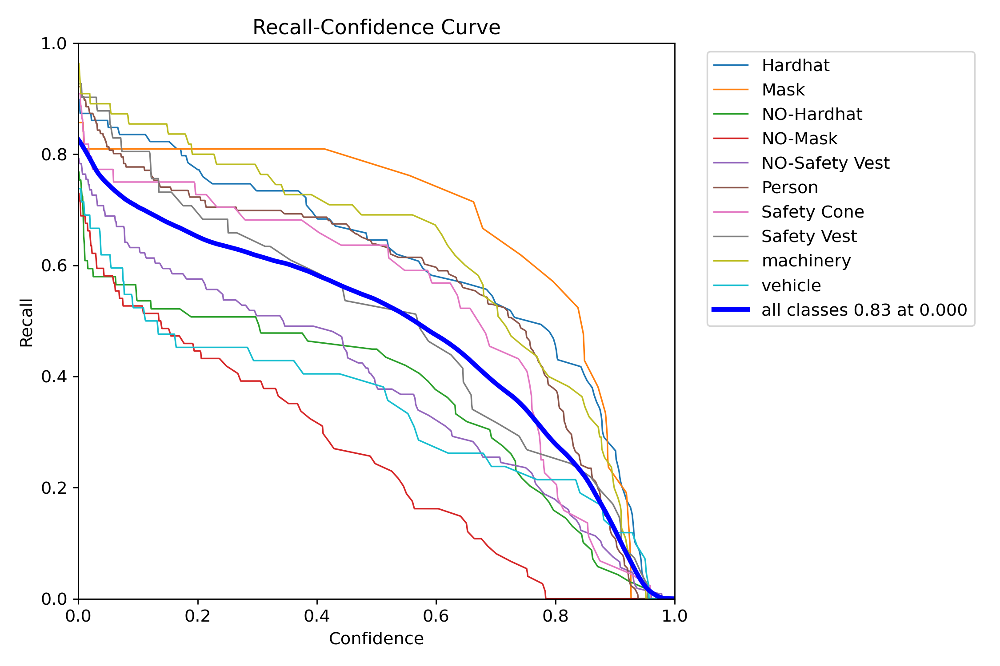

In [ ]:
Image(filename=f'/content/runs/detect/train2/R_curve.png', width=900)

# 😎 Inference on test data


---
We will pick randomly 15 images from the test dataset and visualize them to evaluate the results.


In [ ]:
detection_results = model.predict(source=os.path.join(INPUT_DIR, 'test/images'), save=True)


image 1/82 /content/Construction-Site-Safety-28/test/images/-4405-_png_jpg.rf.82b5c10b2acd1cfaa24259ada8e599fe.jpg: 640x640 (no detections), 29.5ms
image 2/82 /content/Construction-Site-Safety-28/test/images/000005_jpg.rf.96e9379ccae638140c4a90fc4b700a2b.jpg: 640x640 2 Hardhats, 1 NO-Mask, 1 Person, 17.6ms
image 3/82 /content/Construction-Site-Safety-28/test/images/002551_jpg.rf.ce4b9f934161faa72c80dc6898d37b2d.jpg: 640x640 3 Hardhats, 1 NO-Mask, 4 NO-Safety Vests, 3 Persons, 19.7ms
image 4/82 /content/Construction-Site-Safety-28/test/images/003357_jpg.rf.9867f91e88089bb68dc95947d5116d14.jpg: 640x640 1 Hardhat, 3 NO-Masks, 2 Persons, 1 Safety Cone, 1 vehicle, 17.6ms
image 5/82 /content/Construction-Site-Safety-28/test/images/004063_jpg.rf.1b7cdc4035bcb24ef69b8798b444053e.jpg: 640x640 5 Hardhats, 4 NO-Safety Vests, 8 Persons, 2 Safety Vests, 17.2ms
image 6/82 /content/Construction-Site-Safety-28/test/images/004763_jpg.rf.46484e6ca73caeaa9de45822cf1085a9.jpg: 640x640 3 Hardhats, 2 NO-Ma

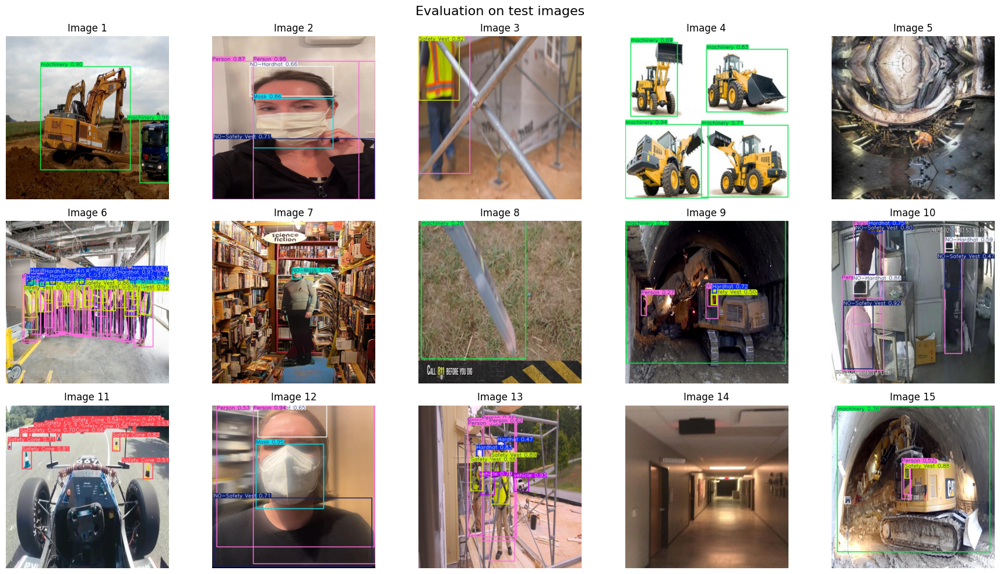

In [ ]:
det_res_out_path = '/content/runs/detect/train3'

test_imgs_with_pred = glob.glob(os.path.join(det_res_out_path,'*.jpg'))

fig, axes = plt.subplots(3, 5, figsize=(18, 10))
fig.suptitle('Evaluation on test images', fontsize=16)

# Randomly select 15 images
selected_images = random.sample(test_imgs_with_pred, 15)

for i, ax in enumerate(axes.flatten()):
    image = cv2.imread(selected_images[i])
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax.imshow(image)
    ax.axis("off")
    ax.set_title(f"Image {i+1}")

plt.tight_layout()
plt.show()

After evaluating the object detector, we found that the bounding boxes are generally well-aligned with the detected objects, often displaying high confidence scores that indicate reliable detections. However, a few instances exhibited lower confidence scores, pointing to potential uncertainties. Overall, the object detector performs reasonably well on the test set. Further fine-tuning or experimenting with different models could enhance performance, particularly in challenging cases.

# Next steps


---

- Conduct hyperparameter tuning for YOLO11 model.

- Use grid search to explore different combinations.

- Focus on adjusting learning rate, epochs, and batch size.

- Identify optimal parameters to train the final model.

# Hyperparameter tuning


---
In this section we performed the hyperparameter tuning process aimed at refining key parameters to achieve better detection accuracy and generalization.

This tuning was conducted systematically using a **grid search** approach, where we explored 6 combinations of selected hyperparameters(batch size , epochs) and evaluated their impact on the model's performance metrics the tuning will give us the best size of batch and epochs and then we will use them to train the final model.


In [ ]:

class YOLOHyperparameterTuner:
    def __init__(self, base_model='yolov11n.pt', data_path=None):
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.base_model = base_model
        self.data_path = data_path
        self.results_dir = Path('hyperparameter_tuning_results')
        self.results_dir.mkdir(exist_ok=True)

        # Define hyperparameter search space
        self.param_grid = {
            'batch': [32, 64],
            'epochs': [10,50,100]

        }

        self.results = []

    def _clear_memory(self):
        """Clear GPU memory between training runs"""
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

    def _initialize_model(self):
        """Initialize a fresh model for each training run"""
        self._clear_memory()
        return YOLO(self.base_model)

    def _save_results(self, params, metrics):
        """Save training results and metrics"""
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        result_dict = {
            'timestamp': timestamp,
            'parameters': params,
            'metrics': metrics
        }
        self.results.append(result_dict)

        # Save to JSON
        with open(self.results_dir / f'results_{timestamp}.json', 'w') as f:
            json.dump(result_dict, f, indent=4)

    def train_and_evaluate(self, params):
        """Train and evaluate model with given parameters"""
        try:
            model = self._initialize_model()

            # Training
            results = model.train(
                data=os.path.join(WORK_DIR, 'data.yaml'),
                **params,
                device=self.device,
                plots=True,
                save=True,
                exist_ok=True
            )

            # Validation
            val_results = model.val(data=self.data_path)

            metrics = {
                'mAP50': float(val_results.box.map50),
                'mAP50-95': float(val_results.box.map),
                'precision': float(val_results.box.mp),
                'recall': float(val_results.box.mr),
                'fitness': float(val_results.fitness)
            }

            self._save_results(params, metrics)
            return metrics

        except Exception as e:
            print(f"Error during training: {str(e)}")
            return None
        finally:
            self._clear_memory()

    def run_tuning(self):
        """Run hyperparameter tuning with all combinations"""
        param_combinations = ParameterGrid(self.param_grid)
        total_combinations = len(list(ParameterGrid(self.param_grid)))

        print(f"Starting hyperparameter tuning with {total_combinations} combinations")

        best_fitness = -float('inf')
        best_params = None

        for i, params in enumerate(param_combinations, 1):
            print(f"\nTesting combination {i}/{total_combinations}")
            print(f"Parameters: {params}")

            metrics = self.train_and_evaluate(params)

            if metrics and metrics['fitness'] > best_fitness:
                best_fitness = metrics['fitness']
                best_params = params

            # Save progress
            self.save_tuning_results()

        return best_params, best_fitness

    def save_tuning_results(self):
        """Save all tuning results to CSV"""
        results_df = pd.DataFrame([
            {**r['parameters'], **r['metrics'], 'timestamp': r['timestamp']}
            for r in self.results
        ])
        results_df.to_csv(self.results_dir / 'all_results.csv', index=False)



# Usage
if __name__ == "__main__":
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)
    torch.manual_seed(42)

    # Initialize tuner
    tuner = YOLOHyperparameterTuner(
        base_model='yolo11n.pt',
        data_path='/content/RiakRadar/data.yaml'
    )

    # Run hyperparameter tuning
    best_params, best_fitness = tuner.run_tuning()

    print("\nBest Parameters:")
    print(json.dumps(best_params, indent=4))
    print(f"\nBest Fitness Score: {best_fitness}")



    if final_model:
        print("\nHyperparameter tuning completed successfully!")
    else:
        print("\nError occurred during training!")

Starting hyperparameter tuning with 6 combinations

Testing combination 1/6
Parameters: {'batch': 32, 'epochs': 10}
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/RiakRadar/data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.61G      1.434      3.293      1.502        174        640: 100%|██████████| 82/82 [00:14<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.51it/s]

                   all        114        697      0.669      0.195      0.297      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.12G      1.389      2.006      1.469        181        640: 100%|██████████| 82/82 [00:12<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all        114        697      0.542      0.438      0.467      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.92G      1.335      1.711      1.428        177        640: 100%|██████████| 82/82 [00:12<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all        114        697      0.585      0.449      0.469      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       6.8G      1.301        1.6      1.406        241        640: 100%|██████████| 82/82 [00:12<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all        114        697      0.638      0.467      0.501      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.83G      1.258      1.473       1.37        131        640: 100%|██████████| 82/82 [00:11<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all        114        697      0.729      0.539      0.593      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.16G      1.208      1.365      1.341        193        640: 100%|██████████| 82/82 [00:11<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all        114        697      0.716      0.556      0.605        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.47G      1.171      1.274      1.312        122        640: 100%|██████████| 82/82 [00:11<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all        114        697      0.758      0.562      0.637      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       6.4G      1.134      1.202      1.282        202        640: 100%|██████████| 82/82 [00:12<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all        114        697      0.833      0.614      0.706      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.07G      1.101      1.142      1.257        137        640: 100%|██████████| 82/82 [00:11<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all        114        697       0.79      0.638      0.689      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.41G      1.063      1.084      1.232        171        640: 100%|██████████| 82/82 [00:11<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]

                   all        114        697      0.789      0.639      0.702      0.368



10 epochs completed in 0.039 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


                   all        114        697       0.79      0.642      0.702      0.368
               Hardhat         42         79       0.88      0.709      0.811      0.483
                  Mask         19         21      0.896       0.81      0.807      0.432
            NO-Hardhat         37         69      0.767      0.478      0.553       0.21
               NO-Mask         44         74      0.746      0.446      0.491      0.189
        NO-Safety Vest         56        106       0.76      0.598      0.626      0.313
                Person         84        166      0.826      0.687      0.781      0.415
           Safety Cone         13         44      0.649      0.886      0.877      0.428
           Safety Vest         28         41       0.93      0.649      0.816      0.464
             machinery         26         55      0.825      0.836      0.876      0.515
               vehicle         16         42      0.625      0.317      0.382      0.231
Speed: 0.1ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]


                   all        114        697      0.796      0.641      0.702      0.369
               Hardhat         42         79      0.881      0.709      0.812      0.481
                  Mask         19         21      0.897       0.81      0.807      0.432
            NO-Hardhat         37         69      0.765      0.478      0.552       0.21
               NO-Mask         44         74      0.783      0.446      0.493      0.193
        NO-Safety Vest         56        106       0.76      0.598      0.626      0.314
                Person         84        166      0.829      0.687      0.781      0.416
           Safety Cone         13         44       0.66      0.886      0.879      0.424
           Safety Vest         28         41       0.93      0.647      0.816      0.472
             machinery         26         55      0.828      0.836      0.876      0.515
               vehicle         16         42      0.624      0.317      0.382      0.231
Speed: 0.6ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.68G      1.396      3.373      1.476        277        640: 100%|██████████| 82/82 [00:14<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all        114        697       0.72      0.189      0.283      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       8.4G      1.331      2.033      1.443        315        640: 100%|██████████| 82/82 [00:13<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]

                   all        114        697      0.543      0.391      0.419      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.93G      1.261      1.697      1.407        245        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all        114        697      0.472       0.39      0.391      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.44G      1.254      1.609      1.392        298        640: 100%|██████████| 82/82 [00:12<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]

                   all        114        697      0.664      0.443      0.491      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.66G      1.211      1.507      1.357        280        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.01it/s]

                   all        114        697      0.596      0.423      0.461      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.19G      1.184      1.434      1.342        237        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.14it/s]

                   all        114        697      0.658      0.527       0.57      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.75G      1.161       1.37      1.328        175        640: 100%|██████████| 82/82 [00:12<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all        114        697      0.642      0.502      0.538      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.47G      1.141      1.314      1.305        309        640: 100%|██████████| 82/82 [00:12<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.704        0.5      0.547      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.88G      1.126      1.285      1.299        266        640: 100%|██████████| 82/82 [00:12<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.87it/s]

                   all        114        697      0.731      0.488      0.552      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.09G      1.116      1.246      1.286        318        640: 100%|██████████| 82/82 [00:12<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.88it/s]

                   all        114        697      0.698      0.537      0.578      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.61G      1.119      1.233      1.286        254        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.42it/s]


                   all        114        697      0.719      0.536      0.596      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.18G      1.092      1.181      1.266        238        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.30it/s]

                   all        114        697      0.712      0.578      0.626      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       6.9G      1.086      1.152      1.255        411        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]


                   all        114        697       0.76      0.551      0.628      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.44G      1.069      1.132      1.253        321        640: 100%|██████████| 82/82 [00:12<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]


                   all        114        697      0.722      0.607      0.635      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       7.3G      1.063      1.104      1.246        245        640: 100%|██████████| 82/82 [00:12<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]


                   all        114        697      0.793       0.59      0.647      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.52G      1.052       1.09      1.238        289        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all        114        697      0.779      0.569      0.634      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.94G      1.038       1.06      1.227        368        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all        114        697      0.757      0.596      0.653      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.48G       1.03      1.046      1.227        213        640: 100%|██████████| 82/82 [00:12<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]


                   all        114        697      0.783      0.562      0.634      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.37G       1.02      1.026      1.209        337        640: 100%|██████████| 82/82 [00:12<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]


                   all        114        697      0.816      0.581      0.665      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.05G      1.015      1.012       1.21        247        640: 100%|██████████| 82/82 [00:12<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]


                   all        114        697      0.773      0.619      0.666      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.79G      1.002     0.9917      1.205        247        640: 100%|██████████| 82/82 [00:12<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]


                   all        114        697      0.799      0.622      0.683      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.22G      1.001     0.9754      1.198        202        640: 100%|██████████| 82/82 [00:12<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all        114        697      0.814      0.622      0.676      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.86G     0.9934      0.962      1.193        250        640: 100%|██████████| 82/82 [00:12<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]

                   all        114        697      0.809      0.635      0.706      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.83G     0.9731     0.9484      1.188        263        640: 100%|██████████| 82/82 [00:12<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.14it/s]

                   all        114        697      0.775       0.62      0.683       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.43G     0.9682     0.9258      1.178        349        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]


                   all        114        697      0.839      0.626      0.701      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.33G     0.9705      0.916      1.175        258        640: 100%|██████████| 82/82 [00:12<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.42it/s]


                   all        114        697      0.857      0.628      0.718      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.74G     0.9641      0.919      1.175        231        640: 100%|██████████| 82/82 [00:12<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all        114        697      0.869      0.621      0.702      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.44G     0.9479     0.9016      1.166        269        640: 100%|██████████| 82/82 [00:12<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]


                   all        114        697      0.817      0.674      0.728      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.77G      0.945     0.8817      1.159        286        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

                   all        114        697      0.837      0.641       0.73        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.16G     0.9371     0.8821      1.159        288        640: 100%|██████████| 82/82 [00:12<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all        114        697      0.831      0.648      0.739      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.69G     0.9326     0.8666      1.157        160        640: 100%|██████████| 82/82 [00:12<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all        114        697      0.815      0.685       0.74      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.07G     0.9227     0.8544      1.145        239        640: 100%|██████████| 82/82 [00:12<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.43it/s]

                   all        114        697      0.886      0.654      0.747        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.81G     0.9182     0.8473      1.147        210        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]


                   all        114        697      0.801       0.65      0.723      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.31G     0.9137      0.842      1.141        296        640: 100%|██████████| 82/82 [00:12<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all        114        697       0.85      0.681      0.748      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.75G     0.9042     0.8253      1.138        341        640: 100%|██████████| 82/82 [00:12<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]

                   all        114        697      0.835      0.667      0.737      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.28G     0.9129     0.8238      1.133        384        640: 100%|██████████| 82/82 [00:12<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]


                   all        114        697       0.87      0.665      0.765      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.33G     0.8973     0.8097      1.126        226        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all        114        697      0.867       0.67      0.763      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.38G      0.886     0.7977      1.122        299        640: 100%|██████████| 82/82 [00:12<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.43it/s]

                   all        114        697       0.85      0.665      0.761      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.23G     0.8811     0.7903      1.123        215        640: 100%|██████████| 82/82 [00:12<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]

                   all        114        697      0.878      0.684      0.767       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.17G     0.8732     0.7828      1.117        213        640: 100%|██████████| 82/82 [00:12<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all        114        697      0.878      0.689      0.769      0.449


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.49G     0.8914     0.7278      1.128        147        640: 100%|██████████| 82/82 [00:13<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]


                   all        114        697      0.858      0.664      0.756      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.8G     0.8653     0.6897       1.11        134        640: 100%|██████████| 82/82 [00:11<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]


                   all        114        697      0.899       0.67      0.765      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.94G      0.851      0.666      1.101        150        640: 100%|██████████| 82/82 [00:11<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]


                   all        114        697      0.846      0.691      0.762      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.89G     0.8523     0.6667      1.097        200        640: 100%|██████████| 82/82 [00:11<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]


                   all        114        697      0.866        0.7       0.77      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.17G     0.8365     0.6536      1.093        212        640: 100%|██████████| 82/82 [00:11<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all        114        697      0.859      0.705      0.778      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.21G       0.82     0.6402      1.085        177        640: 100%|██████████| 82/82 [00:12<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]


                   all        114        697      0.842      0.721      0.784      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.58G     0.8145      0.637       1.08        127        640: 100%|██████████| 82/82 [00:12<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all        114        697      0.882      0.694      0.771      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.88G     0.8101     0.6326      1.079        172        640: 100%|██████████| 82/82 [00:11<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.873      0.708      0.779      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.47G     0.8079      0.629      1.073        158        640: 100%|██████████| 82/82 [00:11<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.35it/s]


                   all        114        697      0.866      0.715       0.78       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.84G     0.7965     0.6195      1.066        169        640: 100%|██████████| 82/82 [00:11<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all        114        697      0.872      0.716      0.786      0.471

50 epochs completed in 0.190 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]


                   all        114        697      0.872      0.708      0.779      0.474
               Hardhat         42         79      0.953      0.762      0.864      0.561
                  Mask         19         21          1      0.851      0.916      0.599
            NO-Hardhat         37         69       0.88      0.565      0.657      0.347
               NO-Mask         44         74      0.851      0.568      0.634      0.285
        NO-Safety Vest         56        106      0.872      0.613      0.708      0.421
                Person         84        166      0.857      0.759      0.857      0.551
           Safety Cone         13         44      0.864      0.886      0.889      0.496
           Safety Vest         28         41      0.939      0.748      0.858      0.548
             machinery         26         55      0.876      0.855      0.903      0.592
               vehicle         16         42      0.627      0.476       0.51      0.339
Speed: 0.1ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]


                   all        114        697      0.872      0.708      0.781      0.475
               Hardhat         42         79      0.952      0.761      0.864      0.562
                  Mask         19         21          1      0.852      0.916      0.613
            NO-Hardhat         37         69      0.881      0.565      0.666      0.347
               NO-Mask         44         74      0.848      0.568      0.639      0.282
        NO-Safety Vest         56        106      0.872      0.613      0.707      0.421
                Person         84        166      0.851      0.753      0.855      0.552
           Safety Cone         13         44      0.865      0.886      0.889      0.487
           Safety Vest         28         41      0.939      0.748      0.858      0.551
             machinery         26         55      0.876      0.855      0.908       0.59
               vehicle         16         42      0.634      0.476       0.51      0.344
Speed: 0.1ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.45G      1.396      3.373      1.476        277        640: 100%|██████████| 82/82 [00:13<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all        114        697       0.72      0.189      0.283      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       8.4G       1.33      2.027      1.444        315        640: 100%|██████████| 82/82 [00:12<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all        114        697      0.525      0.407      0.421      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.92G      1.263      1.693      1.408        245        640: 100%|██████████| 82/82 [00:12<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all        114        697      0.462      0.422      0.416      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.44G      1.259      1.605       1.39        298        640: 100%|██████████| 82/82 [00:12<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.56it/s]

                   all        114        697      0.546      0.427      0.438      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.66G      1.215      1.509      1.361        280        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.36it/s]

                   all        114        697      0.618      0.443      0.483      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.18G      1.196      1.451      1.348        237        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.78it/s]

                   all        114        697      0.598      0.447        0.5      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.75G      1.166      1.384      1.331        175        640: 100%|██████████| 82/82 [00:12<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


                   all        114        697      0.695      0.529      0.565      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.47G      1.154      1.334      1.314        309        640: 100%|██████████| 82/82 [00:12<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all        114        697      0.742      0.483      0.566       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.88G      1.133      1.301      1.301        266        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.669      0.501      0.538      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.09G      1.127      1.267      1.295        318        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]

                   all        114        697      0.732      0.513      0.577       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.61G       1.13      1.248      1.292        254        640: 100%|██████████| 82/82 [00:12<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.93it/s]

                   all        114        697      0.712      0.528      0.592       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.18G      1.102      1.193      1.272        238        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all        114        697      0.714      0.534      0.589      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       6.9G      1.097      1.172      1.262        411        640: 100%|██████████| 82/82 [00:12<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.10it/s]

                   all        114        697       0.73      0.554      0.601      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.44G      1.085      1.156      1.262        321        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]

                   all        114        697      0.745      0.527      0.584      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       7.3G      1.083      1.128      1.258        245        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.29it/s]

                   all        114        697      0.731      0.567      0.611      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.52G       1.07      1.116       1.25        289        640: 100%|██████████| 82/82 [00:12<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all        114        697      0.802      0.502      0.586      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.94G      1.058      1.088      1.241        368        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.04it/s]

                   all        114        697      0.773      0.552       0.62      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.48G      1.055      1.076      1.241        213        640: 100%|██████████| 82/82 [00:12<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all        114        697      0.824      0.535      0.637      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.37G      1.037      1.054      1.223        337        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all        114        697      0.777      0.597      0.637      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.05G      1.037      1.038      1.223        247        640: 100%|██████████| 82/82 [00:12<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.757      0.613      0.666       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.79G      1.028      1.034      1.221        247        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]

                   all        114        697      0.723      0.598      0.646       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.22G      1.026      1.013      1.214        202        640: 100%|██████████| 82/82 [00:12<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all        114        697      0.826      0.624      0.704      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.86G      1.017     0.9982      1.211        250        640: 100%|██████████| 82/82 [00:12<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]


                   all        114        697      0.782      0.594      0.662      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.83G     0.9999     0.9888      1.205        263        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.29it/s]

                   all        114        697      0.808      0.594      0.662      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.43G     0.9983     0.9657      1.197        349        640: 100%|██████████| 82/82 [00:12<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]

                   all        114        697      0.782      0.602       0.67      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.33G     0.9956      0.949       1.19        258        640: 100%|██████████| 82/82 [00:12<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all        114        697      0.808      0.652      0.709      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.74G     0.9925      0.958      1.194        231        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all        114        697      0.809      0.632      0.705      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.44G     0.9892     0.9538      1.192        269        640: 100%|██████████| 82/82 [00:11<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all        114        697      0.732      0.651      0.689      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.77G     0.9761     0.9243      1.177        286        640: 100%|██████████| 82/82 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.822      0.641      0.711      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.15G     0.9715      0.923      1.181        288        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]

                   all        114        697      0.785      0.656      0.711      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.69G      0.967     0.9133      1.179        160        640: 100%|██████████| 82/82 [00:12<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all        114        697      0.839      0.635      0.702      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.07G     0.9613     0.9015      1.169        239        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]


                   all        114        697      0.803      0.674      0.727      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.81G      0.962     0.9008      1.174        210        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]


                   all        114        697      0.799      0.629      0.705      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.31G     0.9562     0.8919      1.166        296        640: 100%|██████████| 82/82 [00:12<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]


                   all        114        697      0.837      0.645      0.709      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.75G     0.9461     0.8775      1.164        341        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.36it/s]


                   all        114        697      0.835      0.649      0.723      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.28G     0.9568     0.8722      1.157        384        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all        114        697      0.793      0.665       0.73      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.33G      0.944     0.8637      1.153        226        640: 100%|██████████| 82/82 [00:12<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]


                   all        114        697      0.811      0.652      0.714      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.38G     0.9353     0.8547       1.15        299        640: 100%|██████████| 82/82 [00:12<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all        114        697      0.827      0.676      0.746      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.23G     0.9301     0.8454      1.153        215        640: 100%|██████████| 82/82 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all        114        697      0.875      0.638      0.737      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.17G     0.9317     0.8452      1.152        213        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.36it/s]

                   all        114        697      0.851      0.644      0.727      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.81G     0.9219     0.8383      1.142        254        640: 100%|██████████| 82/82 [00:12<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all        114        697      0.836      0.661      0.748      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.67G     0.9285     0.8402      1.145        241        640: 100%|██████████| 82/82 [00:12<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all        114        697      0.845      0.682       0.75       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.33G     0.9142     0.8224       1.14        345        640: 100%|██████████| 82/82 [00:12<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.02it/s]

                   all        114        697      0.856      0.668      0.737       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.53G     0.9097     0.8147      1.135        389        640: 100%|██████████| 82/82 [00:12<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]

                   all        114        697      0.843      0.651      0.731      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.79G     0.9071     0.8113      1.136        157        640: 100%|██████████| 82/82 [00:12<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]

                   all        114        697      0.862      0.677      0.752       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       7.6G     0.9027     0.8011      1.129        365        640: 100%|██████████| 82/82 [00:12<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]

                   all        114        697       0.83      0.688      0.759      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.49G     0.8905     0.7894      1.126        263        640: 100%|██████████| 82/82 [00:12<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]

                   all        114        697      0.838      0.669      0.735      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.08G     0.8879     0.7898      1.129        270        640: 100%|██████████| 82/82 [00:12<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]


                   all        114        697      0.864      0.701      0.757      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.45G      0.892     0.7942      1.128        316        640: 100%|██████████| 82/82 [00:12<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]


                   all        114        697       0.84      0.704      0.751      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.61G     0.8837     0.7777      1.118        313        640: 100%|██████████| 82/82 [00:12<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]

                   all        114        697       0.85      0.687      0.752      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.08G      0.885     0.7771      1.116        398        640: 100%|██████████| 82/82 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]

                   all        114        697      0.845      0.666      0.745       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.37G     0.8732     0.7627      1.112        177        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all        114        697       0.88      0.695      0.774      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.58G     0.8673     0.7609      1.111        276        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all        114        697      0.863      0.661      0.749      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.25G      0.877     0.7607      1.115        313        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]


                   all        114        697      0.886      0.668      0.757      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.78G     0.8662     0.7495      1.109        242        640: 100%|██████████| 82/82 [00:12<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]


                   all        114        697      0.856      0.682      0.766      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.02G     0.8699     0.7479      1.106        271        640: 100%|██████████| 82/82 [00:12<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all        114        697      0.868       0.69      0.773      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.39G     0.8567     0.7464      1.104        249        640: 100%|██████████| 82/82 [00:12<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]


                   all        114        697      0.848      0.708      0.773      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.84G     0.8602     0.7478      1.101        200        640: 100%|██████████| 82/82 [00:12<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]


                   all        114        697      0.841      0.736      0.777      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.69G     0.8583     0.7414      1.103        369        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]

                   all        114        697      0.842      0.695      0.767      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.38G     0.8478     0.7274      1.098        246        640: 100%|██████████| 82/82 [00:12<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all        114        697      0.846      0.715      0.781      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.99G     0.8508     0.7319      1.105        397        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.55it/s]


                   all        114        697      0.836      0.726      0.787      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.59G     0.8423     0.7214      1.096        282        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]

                   all        114        697      0.841      0.739      0.784      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.59G     0.8365     0.7204      1.091        324        640: 100%|██████████| 82/82 [00:12<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.83it/s]

                   all        114        697      0.804      0.743      0.776      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.84G     0.8335     0.7131      1.088        230        640: 100%|██████████| 82/82 [00:12<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all        114        697       0.85      0.708      0.773      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.36G     0.8314     0.7062      1.088        161        640: 100%|██████████| 82/82 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]


                   all        114        697      0.886      0.705      0.782      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.13G     0.8351     0.7135      1.089        226        640: 100%|██████████| 82/82 [00:12<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all        114        697      0.871      0.719      0.781      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.13G     0.8278     0.7049      1.088        341        640: 100%|██████████| 82/82 [00:12<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all        114        697      0.861      0.724      0.784      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.71G     0.8288     0.7033      1.085        253        640: 100%|██████████| 82/82 [00:12<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]

                   all        114        697      0.876      0.722      0.793      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.01G      0.825     0.6983      1.082        295        640: 100%|██████████| 82/82 [00:12<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.56it/s]


                   all        114        697      0.855      0.708      0.778      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.71G     0.8243     0.6938      1.082        368        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]


                   all        114        697      0.908      0.699      0.786      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.94G     0.8138     0.6848      1.074        340        640: 100%|██████████| 82/82 [00:12<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]


                   all        114        697      0.835      0.739      0.785      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.54G     0.8133     0.6883      1.073        331        640: 100%|██████████| 82/82 [00:12<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.91it/s]

                   all        114        697       0.87      0.713      0.791      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.84G     0.8109     0.6842      1.071        421        640: 100%|██████████| 82/82 [00:12<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all        114        697      0.879      0.718      0.792      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.48G     0.8119     0.6776      1.074        392        640: 100%|██████████| 82/82 [00:12<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all        114        697      0.874       0.74      0.795      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.04G     0.8048     0.6746      1.071        276        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all        114        697      0.901       0.71      0.791      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.99G     0.8083     0.6736      1.072        283        640: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]


                   all        114        697      0.917      0.694      0.792      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.86G     0.7957     0.6664      1.065        242        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all        114        697      0.864      0.743      0.794       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.65G     0.7994     0.6689      1.065        264        640: 100%|██████████| 82/82 [00:12<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]

                   all        114        697      0.887      0.718      0.795      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.93G     0.8035     0.6671      1.067        276        640: 100%|██████████| 82/82 [00:12<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.36it/s]

                   all        114        697       0.87      0.735      0.797      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.49G     0.7883     0.6625      1.065        255        640: 100%|██████████| 82/82 [00:12<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]

                   all        114        697      0.862      0.749      0.791      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.32G     0.7873     0.6532      1.062        366        640: 100%|██████████| 82/82 [00:12<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.29it/s]


                   all        114        697      0.898      0.738      0.807      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.26G     0.7809     0.6523      1.058        253        640: 100%|██████████| 82/82 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]


                   all        114        697      0.898      0.712      0.795      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.01G     0.7742     0.6442      1.056        274        640: 100%|██████████| 82/82 [00:12<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all        114        697      0.879      0.745      0.799      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.56G     0.7723     0.6397      1.052        276        640: 100%|██████████| 82/82 [00:12<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]


                   all        114        697      0.874      0.739      0.805      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.54G       0.77     0.6382      1.054        376        640: 100%|██████████| 82/82 [00:12<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all        114        697      0.886      0.718      0.797      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.22G     0.7675     0.6363      1.048        260        640: 100%|██████████| 82/82 [00:12<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]


                   all        114        697       0.86      0.739      0.797      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.41G     0.7721     0.6316      1.048        236        640: 100%|██████████| 82/82 [00:12<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all        114        697      0.908      0.716      0.797      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.78G     0.7731     0.6385      1.053        252        640: 100%|██████████| 82/82 [00:12<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all        114        697      0.887      0.719      0.788      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.34G     0.7583     0.6309      1.048        265        640: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all        114        697      0.912      0.719      0.799      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.45G     0.7565     0.6314      1.049        232        640: 100%|██████████| 82/82 [00:12<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]


                   all        114        697      0.872      0.753      0.798      0.518
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.64G     0.7684     0.5696      1.048        120        640: 100%|██████████| 82/82 [00:13<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all        114        697      0.899      0.723      0.789      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.82G     0.7453     0.5422      1.036        173        640: 100%|██████████| 82/82 [00:12<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all        114        697      0.853      0.749      0.797      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       6.5G     0.7404     0.5361      1.038        218        640: 100%|██████████| 82/82 [00:11<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]

                   all        114        697      0.878      0.748      0.798      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.26G     0.7341     0.5291      1.031        163        640: 100%|██████████| 82/82 [00:12<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.43it/s]

                   all        114        697      0.891      0.734        0.8      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.18G     0.7314     0.5273      1.029        192        640: 100%|██████████| 82/82 [00:12<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]


                   all        114        697      0.882      0.744      0.801      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.77G      0.726     0.5261      1.025        195        640: 100%|██████████| 82/82 [00:11<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all        114        697      0.873      0.743      0.799      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.49G     0.7217     0.5212      1.025        159        640: 100%|██████████| 82/82 [00:12<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.35it/s]


                   all        114        697      0.887      0.747      0.803      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.26G     0.7177     0.5171      1.021        171        640: 100%|██████████| 82/82 [00:11<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]

                   all        114        697      0.879      0.745      0.801      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.89G     0.7121     0.5098      1.017        141        640: 100%|██████████| 82/82 [00:11<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all        114        697      0.877      0.745      0.802      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.81G     0.7087     0.5099      1.012        136        640: 100%|██████████| 82/82 [00:12<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]


                   all        114        697      0.888      0.739      0.801      0.508

100 epochs completed in 0.380 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]


                   all        114        697      0.871      0.752      0.798      0.519
               Hardhat         42         79      0.943      0.772      0.863      0.541
                  Mask         19         21      0.949      0.879      0.926      0.715
            NO-Hardhat         37         69      0.845      0.638      0.664      0.401
               NO-Mask         44         74       0.87      0.581      0.628      0.339
        NO-Safety Vest         56        106      0.871      0.708      0.776      0.485
                Person         84        166      0.901      0.777      0.856      0.565
           Safety Cone         13         44      0.866      0.878      0.885      0.548
           Safety Vest         28         41      0.918      0.805      0.882      0.572
             machinery         26         55      0.886      0.909      0.933      0.683
               vehicle         16         42      0.664      0.571      0.568      0.341
Speed: 0.1ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]


                   all        114        697      0.871      0.752      0.799      0.519
               Hardhat         42         79      0.943      0.772      0.866       0.54
                  Mask         19         21      0.949       0.88      0.927      0.713
            NO-Hardhat         37         69      0.846      0.638      0.664      0.402
               NO-Mask         44         74      0.869      0.581      0.638       0.34
        NO-Safety Vest         56        106      0.871      0.708      0.776      0.484
                Person         84        166      0.898      0.777      0.857      0.565
           Safety Cone         13         44      0.866       0.88      0.885      0.544
           Safety Vest         28         41      0.917      0.807      0.882      0.573
             machinery         26         55      0.886      0.909      0.933      0.679
               vehicle         16         42      0.662      0.571      0.567      0.344
Speed: 0.1ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      11.8G      1.432      3.531      1.505        654        640: 100%|██████████| 41/41 [00:12<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all        114        697    0.00936      0.408      0.166     0.0833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      11.8G      1.403      2.296      1.462        539        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all        114        697      0.763      0.251      0.392      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      11.8G      1.343      1.797      1.432        550        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all        114        697      0.495      0.282       0.34      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      12.3G      1.313      1.637      1.411        590        640: 100%|██████████| 41/41 [00:09<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all        114        697      0.504      0.421      0.404      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10        13G      1.264      1.502      1.371        511        640: 100%|██████████| 41/41 [00:09<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697      0.635      0.443      0.499       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10        11G      1.213      1.387      1.335        578        640: 100%|██████████| 41/41 [00:09<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all        114        697      0.678      0.514      0.551      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      12.4G       1.18        1.3      1.313        530        640: 100%|██████████| 41/41 [00:09<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.715      0.557      0.614      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      12.7G      1.141      1.222      1.283        626        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.726       0.54      0.597      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      11.2G      1.095      1.143      1.252        516        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.773      0.587      0.649      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      12.2G      1.063        1.1      1.232        562        640: 100%|██████████| 41/41 [00:09<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.801      0.601      0.674      0.358



10 epochs completed in 0.033 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


                   all        114        697        0.8      0.601      0.674      0.359
               Hardhat         42         79      0.935       0.73      0.799      0.501
                  Mask         19         21      0.868       0.81      0.809      0.439
            NO-Hardhat         37         69      0.805      0.478      0.556      0.233
               NO-Mask         44         74      0.829      0.378       0.48      0.185
        NO-Safety Vest         56        106      0.662      0.462      0.537       0.27
                Person         84        166      0.773      0.698      0.773      0.437
           Safety Cone         13         44      0.787       0.75      0.789      0.399
           Safety Vest         28         41      0.898      0.643      0.778      0.387
             machinery         26         55      0.801      0.727      0.812      0.482
               vehicle         16         42      0.644      0.333      0.411      0.253
Speed: 0.1ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]


                   all        114        697      0.804      0.601      0.676      0.359
               Hardhat         42         79      0.935      0.731        0.8      0.502
                  Mask         19         21      0.868       0.81      0.808      0.439
            NO-Hardhat         37         69      0.805      0.478      0.555      0.236
               NO-Mask         44         74       0.83      0.378      0.483      0.187
        NO-Safety Vest         56        106      0.662      0.461      0.541      0.273
                Person         84        166      0.773      0.699      0.774      0.437
           Safety Cone         13         44      0.788       0.75       0.79      0.402
           Safety Vest         28         41      0.898      0.641      0.778      0.386
             machinery         26         55        0.8      0.727      0.812      0.479
               vehicle         16         42      0.684      0.333      0.417      0.253
Speed: 0.9ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      13.5G      1.395       3.59      1.479       1049        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all        114        697    0.00922      0.341      0.175     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      13.3G      1.358        2.4      1.445       1015        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all        114        697      0.745      0.186      0.304      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      13.8G      1.299       1.81      1.429       1084        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all        114        697      0.601      0.178      0.309      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      11.7G      1.259      1.637      1.398        918        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all        114        697       0.54      0.321      0.347      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      13.4G       1.22      1.519      1.362       1031        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all        114        697      0.561      0.303      0.329      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      11.8G      1.196      1.449      1.349        974        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.634      0.454      0.482      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      12.1G      1.176       1.39      1.333        957        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697      0.602      0.439      0.469      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      12.1G      1.136       1.33      1.307       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.623      0.472      0.518      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      11.4G      1.126      1.287      1.299        993        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.702      0.511      0.554      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      14.9G      1.124      1.242      1.291        831        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.671      0.475      0.524      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      13.1G      1.114      1.221      1.282       1150        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all        114        697      0.669      0.495      0.534      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      12.6G      1.098      1.177      1.271        816        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.714      0.549      0.589      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      13.1G      1.077       1.14       1.25       1219        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all        114        697       0.69      0.511       0.56      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      15.6G      1.064      1.132       1.25       1101        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697        0.7      0.528      0.569      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      11.4G      1.051      1.096      1.235       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all        114        697      0.746      0.536      0.588      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      13.3G      1.043      1.066      1.231        981        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697      0.757      0.586      0.646      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      11.3G      1.032      1.056      1.228        935        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697       0.73      0.558      0.613      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      12.1G      1.027      1.037      1.224        949        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.729       0.59      0.641      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      14.5G      1.021      1.019      1.212        913        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.743      0.555      0.632      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      12.1G      1.012      1.002      1.203       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697       0.74      0.621      0.659      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      13.7G      1.003     0.9898      1.202       1134        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all        114        697      0.825      0.594      0.679      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      12.9G     0.9872     0.9606       1.19        973        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.815       0.62      0.678      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      13.8G     0.9865      0.964      1.193        865        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.859      0.614       0.69      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      12.9G     0.9769     0.9352      1.184        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all        114        697      0.798      0.619      0.673      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50        12G     0.9579     0.9252      1.172        952        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.792      0.624      0.675      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      14.6G     0.9663      0.919      1.175        938        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all        114        697      0.812      0.594       0.68      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      13.7G     0.9549     0.9009      1.166        903        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.775      0.656      0.693      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      11.7G     0.9495     0.8869       1.16       1061        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.806       0.66      0.714      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      14.2G     0.9427     0.8824      1.158        785        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.829      0.658      0.718        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      13.3G     0.9316     0.8705      1.155        797        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.853      0.603      0.691      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      13.2G     0.9261     0.8595       1.15       1094        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697       0.84      0.632      0.719      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50        15G     0.9126     0.8419      1.139       1063        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697      0.876      0.647      0.723       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      13.8G     0.9075     0.8326      1.142        912        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all        114        697       0.85      0.641       0.72      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50        13G     0.9054     0.8281      1.133       1097        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.852      0.668      0.739      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      12.7G     0.9029     0.8177      1.134        969        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all        114        697      0.885      0.639      0.728      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      12.8G     0.8939     0.8103      1.128        989        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697      0.856      0.659       0.73      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      12.5G     0.8835     0.7956      1.123        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.885      0.665      0.747      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      11.9G     0.8867     0.7909      1.117       1015        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697      0.843      0.691       0.75      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      12.9G     0.8591     0.7741      1.111        851        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.906      0.669      0.752      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      14.4G     0.8667     0.7722      1.114        871        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.868      0.687       0.76      0.431


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      12.5G     0.8906     0.7242      1.126        607        640: 100%|██████████| 41/41 [00:12<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.839       0.69      0.744      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      13.2G     0.8553      0.679      1.104        534        640: 100%|██████████| 41/41 [00:09<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.864       0.68      0.751      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      12.3G     0.8435     0.6665      1.098        535        640: 100%|██████████| 41/41 [00:09<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all        114        697      0.862      0.696       0.75       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      11.4G     0.8376     0.6535      1.093        598        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all        114        697      0.863      0.703       0.76      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      11.8G     0.8253     0.6423      1.086        590        640: 100%|██████████| 41/41 [00:09<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697      0.849       0.72      0.765      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50        11G     0.8129     0.6366       1.08        606        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.866      0.702      0.765      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.5G     0.8115      0.633      1.077        597        640: 100%|██████████| 41/41 [00:09<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.874      0.718      0.777      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      12.5G     0.8017     0.6186      1.074        501        640: 100%|██████████| 41/41 [00:09<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.866      0.717      0.782      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50        11G     0.7941     0.6153      1.061        516        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.911        0.7      0.781      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.4G     0.7842     0.6085      1.061        606        640: 100%|██████████| 41/41 [00:09<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.879      0.725      0.785      0.471



50 epochs completed in 0.159 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


                   all        114        697      0.877      0.726      0.786      0.471
               Hardhat         42         79      0.944      0.772      0.827      0.523
                  Mask         19         21          1      0.851      0.899      0.596
            NO-Hardhat         37         69      0.883      0.545      0.646      0.341
               NO-Mask         44         74      0.858      0.608      0.644      0.327
        NO-Safety Vest         56        106       0.86       0.67      0.752       0.43
                Person         84        166      0.904      0.741      0.841      0.526
           Safety Cone         13         44      0.888      0.886      0.886      0.449
           Safety Vest         28         41      0.938       0.78      0.884      0.519
             machinery         26         55      0.879      0.909      0.939      0.654
               vehicle         16         42      0.617        0.5       0.54      0.343
Speed: 0.2ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]


                   all        114        697      0.879      0.726      0.785      0.472
               Hardhat         42         79      0.945      0.772      0.829      0.522
                  Mask         19         21          1       0.85      0.899      0.599
            NO-Hardhat         37         69      0.882      0.543      0.638      0.342
               NO-Mask         44         74      0.871      0.608      0.644      0.324
        NO-Safety Vest         56        106      0.866      0.672      0.753      0.429
                Person         84        166      0.898       0.74      0.841      0.526
           Safety Cone         13         44      0.888      0.886      0.886      0.443
           Safety Vest         28         41      0.939       0.78      0.885      0.528
             machinery         26         55       0.88      0.909      0.939      0.655
               vehicle         16         42      0.615      0.495      0.536       0.35
Speed: 0.1ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      14.2G      1.395       3.59      1.479       1049        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all        114        697    0.00922      0.341      0.175     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      13.3G      1.363      2.398      1.445       1015        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all        114        697      0.788      0.183      0.299      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      13.8G      1.302      1.817      1.429       1084        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all        114        697      0.522      0.254      0.273      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.7G      1.261      1.638      1.399        918        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all        114        697      0.605      0.365        0.4      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      13.4G      1.229      1.525      1.369       1031        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.667       0.38      0.442      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      11.8G      1.201      1.454      1.351        974        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697      0.631      0.404       0.45      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      12.2G       1.18      1.399      1.334        957        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.562      0.346      0.389      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.1G       1.14      1.333      1.308       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.636      0.411       0.47      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      11.4G      1.137      1.309      1.307        993        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697        0.7      0.462      0.517      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      14.9G      1.134      1.267      1.298        831        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all        114        697      0.719      0.469      0.528      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      13.1G      1.129      1.247      1.291       1150        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.669      0.478      0.545      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.6G      1.113      1.204      1.283        816        640: 100%|██████████| 41/41 [00:10<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all        114        697      0.703      0.534      0.574      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      13.1G      1.095      1.174      1.264       1219        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.697      0.536      0.571      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      15.6G      1.073      1.149      1.256       1101        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697       0.69      0.545      0.592      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      11.4G      1.067       1.12      1.245       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all        114        697      0.747      0.552       0.61      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      13.3G      1.061      1.097      1.244        981        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all        114        697      0.708      0.529      0.579      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      11.3G       1.05      1.081      1.238        935        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.751      0.541      0.608      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      12.1G      1.046      1.065      1.237        949        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all        114        697      0.745      0.546      0.614      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      14.5G      1.045      1.051      1.227        913        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.731      0.561      0.629      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      12.1G       1.04      1.038      1.222       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.688      0.516      0.552      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.7G      1.026      1.022      1.219       1134        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.713      0.561      0.608      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.9G      1.012     0.9911      1.205        973        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.747      0.571      0.622      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      13.8G      1.011     0.9911      1.209        865        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697       0.76      0.597      0.657      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.9G      1.004      0.976      1.202        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all        114        697      0.758      0.585      0.648      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100        12G     0.9946      0.967      1.194        952        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.738      0.562      0.625      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      14.6G     0.9982     0.9521      1.192        938        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.772      0.617      0.669      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.7G     0.9889     0.9391      1.188        903        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all        114        697      0.774       0.56      0.612      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.7G     0.9854     0.9297      1.183       1061        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.835      0.634      0.709      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      14.2G     0.9766     0.9282      1.181        785        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.748      0.609      0.664      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      13.3G      0.968     0.9112      1.176        797        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.781      0.585      0.631      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      13.2G     0.9656     0.9013      1.175       1094        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.799      0.666      0.712      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100        15G     0.9558     0.8895      1.166       1063        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697      0.799      0.626      0.699      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      13.8G     0.9492     0.8795      1.167        912        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697      0.803      0.634      0.705       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100        13G     0.9466     0.8741      1.157       1097        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697       0.79       0.63      0.706      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.7G     0.9482     0.8671      1.161        969        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697      0.817      0.618      0.706        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.8G     0.9417     0.8638      1.156        989        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697       0.79      0.633      0.691      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      12.5G     0.9311     0.8478      1.152        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.821      0.627      0.692      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      11.9G     0.9326     0.8428      1.144       1015        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all        114        697      0.863      0.646      0.723      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      12.9G     0.9119     0.8236      1.141        851        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697      0.852      0.651       0.71      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      14.4G      0.922     0.8274      1.146        871        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all        114        697      0.818      0.655      0.723      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      14.1G     0.9144     0.8154      1.138        972        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697      0.793      0.678       0.72      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.4G     0.9151      0.819       1.14        901        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.878      0.673      0.753      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.1G     0.9135      0.812      1.138        994        640: 100%|██████████| 41/41 [00:10<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all        114        697      0.874      0.637      0.728      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      15.5G     0.9063     0.8069      1.136       1005        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.831      0.648       0.72      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      12.5G     0.9036     0.7948      1.131        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.847      0.655      0.731      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      11.8G     0.8947     0.7937      1.125       1029        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.881      0.639      0.724      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100        13G     0.8938     0.7872      1.127        931        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all        114        697      0.848      0.683      0.752      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.5G     0.8955     0.7858      1.126       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.853      0.666      0.746      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      13.9G      0.876     0.7769      1.123       1028        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.867       0.67      0.738      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.7G     0.8862     0.7765       1.12        913        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all        114        697      0.864      0.673      0.743      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      12.4G     0.8787     0.7653      1.111        921        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.847      0.665      0.741      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      15.3G     0.8611     0.7458      1.106       1071        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.888       0.66       0.76      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      13.1G     0.8553     0.7456       1.11        940        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697       0.91      0.663      0.753      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      12.5G     0.8596     0.7387      1.103        933        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.907      0.674      0.764      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      12.3G     0.8563     0.7374      1.099        998        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all        114        697      0.819      0.688      0.746      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      11.5G     0.8607     0.7368      1.101        904        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.872      0.683      0.758      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        14G     0.8571     0.7309      1.101        983        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.851      0.707      0.764      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.5G     0.8497     0.7305      1.095       1082        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697      0.829      0.718      0.774       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      14.1G     0.8474     0.7202      1.095        952        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all        114        697       0.85      0.711      0.769      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.6G     0.8369     0.7279      1.097        807        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.888      0.682      0.772      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      11.9G     0.8328     0.7133      1.095        995        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697       0.84      0.703      0.765      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      12.4G     0.8384     0.7105      1.093       1050        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.883      0.697      0.779      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      11.8G     0.8253     0.7037      1.087       1060        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.849      0.712       0.77      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      11.9G      0.836     0.7066      1.094        948        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697      0.891       0.69      0.781      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      14.2G     0.8344     0.7017      1.085       1120        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.886      0.693      0.777      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.9G     0.8274     0.7042      1.083       1081        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all        114        697      0.887      0.728      0.787      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      11.9G     0.8114     0.6901      1.078        742        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.891       0.68      0.782      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100        13G     0.8286     0.6944      1.079        927        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.859      0.717      0.781      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      14.8G     0.8202     0.6959      1.077       1073        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.872      0.702      0.779      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.5G     0.8026     0.6798      1.071        859        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.908      0.691      0.787      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.5G     0.8115     0.6793      1.074       1005        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.895      0.716      0.789      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.8G     0.7994     0.6703      1.068        860        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.906      0.708      0.791      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      14.8G     0.7997     0.6741       1.07       1056        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all        114        697      0.878      0.711      0.788      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      13.2G     0.8015      0.673       1.07       1085        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all        114        697      0.907      0.701      0.787      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100        14G     0.7979     0.6649      1.066        783        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697       0.88       0.71      0.785      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      12.3G     0.7941      0.656      1.062       1043        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all        114        697      0.874      0.718       0.79      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      17.5G     0.7888     0.6611      1.061        750        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all        114        697       0.92      0.705      0.796      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      13.1G       0.78      0.653      1.056        882        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.886      0.723      0.796      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.7G     0.7864     0.6547      1.063       1002        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.867      0.733      0.792      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      13.7G      0.792     0.6495      1.059       1008        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697        0.9      0.701      0.795      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      11.8G     0.7692     0.6422      1.059        868        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all        114        697      0.883      0.713      0.789      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      12.1G     0.7696     0.6399      1.053       1025        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all        114        697      0.881      0.729      0.801      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      14.5G     0.7731     0.6384      1.054        937        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.889      0.715      0.799      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      13.9G     0.7609     0.6323      1.048        773        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697       0.91      0.714      0.806      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.7G     0.7647     0.6286      1.048       1067        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697      0.862      0.733      0.799      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      13.6G     0.7625     0.6278      1.047        943        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697      0.877      0.737      0.805      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      13.8G     0.7628     0.6223      1.044       1095        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all        114        697      0.942       0.69      0.792      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      15.2G     0.7609     0.6202      1.043        948        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all        114        697      0.909      0.721      0.806       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100        12G     0.7631      0.625      1.044       1072        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all        114        697      0.911      0.706      0.799       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      15.4G     0.7555     0.6194      1.043       1013        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all        114        697      0.923      0.709        0.8      0.513


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      11.7G     0.7625     0.5733      1.043        585        640: 100%|██████████| 41/41 [00:12<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.886      0.734        0.8      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.9G     0.7347     0.5352      1.028        644        640: 100%|██████████| 41/41 [00:09<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all        114        697      0.882      0.745      0.801      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      11.5G     0.7233     0.5221      1.024        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.901      0.732      0.807      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100        11G     0.7216     0.5208      1.023        616        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.892       0.74      0.809      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      12.1G      0.715     0.5191       1.02        731        640: 100%|██████████| 41/41 [00:09<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697      0.912      0.728      0.812      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      12.2G     0.7112     0.5107      1.018        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697      0.888      0.737      0.812      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      11.2G     0.7057     0.5093      1.019        549        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.915      0.739      0.817      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      12.1G     0.7023     0.5043      1.012        496        640: 100%|██████████| 41/41 [00:09<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.915      0.743      0.816       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      11.3G     0.7019     0.5046       1.01        476        640: 100%|██████████| 41/41 [00:09<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.912      0.742      0.814      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      11.2G     0.6981     0.5006      1.008        693        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.917      0.742      0.816      0.531



100 epochs completed in 0.317 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


                   all        114        697      0.918      0.742      0.817      0.531
               Hardhat         42         79      0.925      0.781      0.878      0.607
                  Mask         19         21          1      0.898      0.935      0.685
            NO-Hardhat         37         69      0.871      0.536      0.671      0.386
               NO-Mask         44         74      0.874      0.622      0.669      0.352
        NO-Safety Vest         56        106       0.96      0.689      0.791      0.509
                Person         84        166      0.918      0.753       0.84      0.561
           Safety Cone         13         44      0.884      0.864       0.88      0.514
           Safety Vest         28         41          1      0.793      0.935      0.621
             machinery         26         55      0.912      0.939       0.95      0.697
               vehicle         16         42      0.837      0.548      0.622      0.378
Speed: 0.2ms preproce

val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]


                   all        114        697      0.921      0.741      0.817       0.53
               Hardhat         42         79      0.925       0.78      0.878      0.606
                  Mask         19         21          1      0.898      0.935      0.679
            NO-Hardhat         37         69      0.871      0.536      0.666      0.382
               NO-Mask         44         74      0.867      0.622      0.672      0.354
        NO-Safety Vest         56        106       0.96      0.681       0.79       0.51
                Person         84        166      0.921      0.753       0.84      0.558
           Safety Cone         13         44      0.886      0.864       0.88       0.51
           Safety Vest         28         41          1      0.793      0.935      0.622
             machinery         26         55      0.912      0.938       0.95      0.698
               vehicle         16         42       0.87      0.548       0.62       0.38
Speed: 0.1ms preproce

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      14.2G      1.395       3.59      1.479       1049        640: 100%|██████████| 41/41 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all        114        697    0.00922      0.341      0.175     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      13.3G      1.363      2.398      1.445       1015        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all        114        697      0.788      0.183      0.299      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      13.8G      1.302      1.817      1.429       1084        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all        114        697      0.522      0.254      0.273      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.8G      1.261      1.638      1.399        918        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all        114        697      0.605      0.365        0.4      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      13.4G      1.229      1.525      1.369       1031        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.667       0.38      0.442      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      11.8G      1.201      1.454      1.351        974        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all        114        697      0.631      0.404       0.45      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      12.2G       1.18      1.399      1.334        957        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697      0.562      0.346      0.389      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.1G       1.14      1.333      1.308       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697      0.636      0.411       0.47      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      11.4G      1.137      1.309      1.307        993        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all        114        697        0.7      0.462      0.517      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      14.9G      1.134      1.267      1.298        831        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all        114        697      0.719      0.469      0.528      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      13.1G      1.129      1.247      1.291       1150        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all        114        697      0.669      0.478      0.545      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.6G      1.113      1.204      1.283        816        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.703      0.534      0.574      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      13.1G      1.095      1.174      1.264       1219        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all        114        697      0.697      0.536      0.571      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      15.6G      1.073      1.149      1.256       1101        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all        114        697       0.69      0.545      0.592      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      11.4G      1.067       1.12      1.245       1042        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.747      0.552       0.61      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      13.3G      1.061      1.097      1.244        981        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.708      0.529      0.579      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      11.3G       1.05      1.081      1.238        935        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.751      0.541      0.608      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      12.1G      1.046      1.065      1.237        949        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.745      0.546      0.614      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      14.5G      1.045      1.051      1.227        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.731      0.561      0.629      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      12.2G       1.04      1.038      1.222       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.688      0.516      0.552      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.7G      1.026      1.022      1.219       1134        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.713      0.561      0.608      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.9G      1.012     0.9911      1.205        973        640: 100%|██████████| 41/41 [00:10<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all        114        697      0.747      0.571      0.622      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      13.8G      1.011     0.9911      1.209        865        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all        114        697       0.76      0.597      0.657      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.9G      1.004      0.976      1.202        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697      0.758      0.585      0.648      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100        12G     0.9946      0.967      1.194        952        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.738      0.562      0.625      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      14.6G     0.9982     0.9521      1.192        938        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.772      0.617      0.669      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.7G     0.9889     0.9391      1.188        903        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.774       0.56      0.612      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.7G     0.9854     0.9297      1.183       1061        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.835      0.634      0.709      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      14.2G     0.9766     0.9282      1.181        785        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all        114        697      0.748      0.609      0.664      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      13.3G      0.968     0.9112      1.176        797        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.781      0.585      0.631      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      13.2G     0.9656     0.9013      1.175       1094        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all        114        697      0.799      0.666      0.712      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100        15G     0.9558     0.8895      1.166       1063        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.799      0.626      0.699      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      13.8G     0.9492     0.8795      1.167        912        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.803      0.634      0.705       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100        13G     0.9466     0.8741      1.157       1097        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all        114        697       0.79       0.63      0.706      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.7G     0.9482     0.8671      1.161        969        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697      0.817      0.618      0.706        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.8G     0.9417     0.8638      1.156        989        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697       0.79      0.633      0.691      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      12.5G     0.9311     0.8478      1.152        867        640: 100%|██████████| 41/41 [00:09<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.821      0.627      0.692      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        12G     0.9326     0.8428      1.144       1015        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.863      0.646      0.723      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      12.9G     0.9119     0.8236      1.141        851        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.852      0.651       0.71      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      14.4G      0.922     0.8274      1.146        871        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all        114        697      0.818      0.655      0.723      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      14.1G     0.9144     0.8154      1.138        972        640: 100%|██████████| 41/41 [00:09<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all        114        697      0.793      0.678       0.72      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.4G     0.9151      0.819       1.14        901        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all        114        697      0.878      0.673      0.753      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.1G     0.9135      0.812      1.138        994        640: 100%|██████████| 41/41 [00:09<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.874      0.637      0.728      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      15.5G     0.9063     0.8069      1.136       1005        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all        114        697      0.831      0.648       0.72      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      12.5G     0.9036     0.7948      1.131        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.847      0.655      0.731      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      11.8G     0.8947     0.7937      1.125       1029        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.881      0.639      0.724      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100        13G     0.8938     0.7872      1.127        931        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697      0.848      0.683      0.752      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.5G     0.8955     0.7858      1.126       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all        114        697      0.853      0.666      0.746      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      13.9G      0.876     0.7769      1.123       1028        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.867       0.67      0.738      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.7G     0.8862     0.7765       1.12        913        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.864      0.673      0.743      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      12.4G     0.8787     0.7653      1.111        921        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all        114        697      0.847      0.665      0.741      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      15.3G     0.8611     0.7458      1.106       1071        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.888       0.66       0.76      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      13.1G     0.8553     0.7456       1.11        940        640: 100%|██████████| 41/41 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697       0.91      0.663      0.753      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      12.5G     0.8596     0.7387      1.103        933        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all        114        697      0.907      0.674      0.764      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      12.3G     0.8563     0.7374      1.099        998        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.819      0.688      0.746      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      11.5G     0.8607     0.7368      1.101        904        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all        114        697      0.872      0.683      0.758      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        14G     0.8571     0.7309      1.101        983        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all        114        697      0.851      0.707      0.764      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.5G     0.8497     0.7305      1.095       1082        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.829      0.718      0.774       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      14.1G     0.8474     0.7202      1.095        952        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697       0.85      0.711      0.769      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.6G     0.8369     0.7279      1.097        807        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all        114        697      0.888      0.682      0.772      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      11.9G     0.8328     0.7133      1.095        995        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all        114        697       0.84      0.703      0.765      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      12.4G     0.8384     0.7105      1.093       1050        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.883      0.697      0.779      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      11.8G     0.8253     0.7037      1.087       1060        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.849      0.712       0.77      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      11.9G      0.836     0.7066      1.094        948        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.891       0.69      0.781      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      14.2G     0.8344     0.7017      1.085       1120        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.886      0.693      0.777      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.9G     0.8274     0.7042      1.083       1081        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all        114        697      0.887      0.728      0.787      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      11.9G     0.8114     0.6901      1.078        742        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.891       0.68      0.782      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100        13G     0.8286     0.6944      1.079        927        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697      0.859      0.717      0.781      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      14.8G     0.8202     0.6959      1.077       1073        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.872      0.702      0.779      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.5G     0.8026     0.6798      1.071        859        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.908      0.691      0.787      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.5G     0.8115     0.6793      1.074       1005        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.895      0.716      0.789      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.8G     0.7994     0.6703      1.068        860        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.906      0.708      0.791      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      14.8G     0.7997     0.6741       1.07       1056        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.878      0.711      0.788      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      13.2G     0.8015      0.673       1.07       1085        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all        114        697      0.907      0.701      0.787      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100        14G     0.7979     0.6649      1.066        783        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697       0.88       0.71      0.785      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      12.3G     0.7941      0.656      1.062       1043        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.874      0.718       0.79      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      17.5G     0.7888     0.6611      1.061        750        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697       0.92      0.705      0.796      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      13.1G       0.78      0.653      1.056        882        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.886      0.723      0.796      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.7G     0.7864     0.6547      1.063       1002        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all        114        697      0.867      0.733      0.792      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      13.7G      0.792     0.6495      1.059       1008        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all        114        697        0.9      0.701      0.795      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      11.8G     0.7692     0.6422      1.059        868        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all        114        697      0.883      0.713      0.789      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      12.1G     0.7696     0.6399      1.053       1025        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697      0.881      0.729      0.801      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      14.5G     0.7731     0.6384      1.054        937        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all        114        697      0.889      0.715      0.799      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      13.9G     0.7609     0.6323      1.048        773        640: 100%|██████████| 41/41 [00:10<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all        114        697       0.91      0.714      0.806      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.7G     0.7647     0.6286      1.048       1067        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all        114        697      0.862      0.733      0.799      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      13.6G     0.7625     0.6278      1.047        943        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.877      0.737      0.805      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      13.8G     0.7628     0.6223      1.044       1095        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all        114        697      0.942       0.69      0.792      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      15.2G     0.7609     0.6202      1.043        948        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.909      0.721      0.806       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100        12G     0.7631      0.625      1.044       1072        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.911      0.706      0.799       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      15.4G     0.7555     0.6194      1.043       1013        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.923      0.709        0.8      0.513


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      11.7G     0.7625     0.5733      1.043        585        640: 100%|██████████| 41/41 [00:12<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.886      0.734        0.8      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.9G     0.7347     0.5352      1.028        644        640: 100%|██████████| 41/41 [00:09<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all        114        697      0.882      0.745      0.801      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      11.5G     0.7233     0.5221      1.024        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all        114        697      0.901      0.732      0.807      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100        11G     0.7216     0.5208      1.023        616        640: 100%|██████████| 41/41 [00:09<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all        114        697      0.892       0.74      0.809      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      12.1G      0.715     0.5191       1.02        731        640: 100%|██████████| 41/41 [00:09<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all        114        697      0.912      0.728      0.812      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      12.2G     0.7112     0.5107      1.018        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all        114        697      0.888      0.737      0.812      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      11.2G     0.7057     0.5093      1.019        549        640: 100%|██████████| 41/41 [00:09<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all        114        697      0.915      0.739      0.817      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      12.1G     0.7023     0.5043      1.012        496        640: 100%|██████████| 41/41 [00:09<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all        114        697      0.915      0.743      0.816       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      11.3G     0.7019     0.5046       1.01        476        640: 100%|██████████| 41/41 [00:09<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.912      0.742      0.814      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      11.2G     0.6981     0.5006      1.008        693        640: 100%|██████████| 41/41 [00:09<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.917      0.742      0.816      0.531



100 epochs completed in 0.318 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


                   all        114        697      0.918      0.742      0.817      0.531
               Hardhat         42         79      0.925      0.781      0.878      0.607
                  Mask         19         21          1      0.898      0.935      0.685
            NO-Hardhat         37         69      0.871      0.536      0.671      0.386
               NO-Mask         44         74      0.874      0.622      0.669      0.352
        NO-Safety Vest         56        106       0.96      0.689      0.791      0.509
                Person         84        166      0.918      0.753       0.84      0.561
           Safety Cone         13         44      0.884      0.864       0.88      0.514
           Safety Vest         28         41          1      0.793      0.935      0.621
             machinery         26         55      0.912      0.939       0.95      0.697
               vehicle         16         42      0.837      0.548      0.622      0.378
Speed: 0.2ms preproce

After tuning we found that the best epoch and batch size to train our Yolo11 model : `epoch=100 and batch=64 ` these are the highest values in our search space this indicates that there's a chance that the performance will improve if we increase the epoch and batch size compared to the baseline we did earlier where we choosed `10 epochs` to train the model.

# Training the final Yolo11 model


---
After we identified the best epoch and batch sizes we will now train the final model using them.



In [ ]:
# Load YOLO model
model = YOLO("yolo11n.pt")

# Define the directory for saving training results
output_dir = os.path.join(WORK_DIR, 'final_model_training')

# Train YOLO model with specified parameters
model.train(
    data=os.path.join(WORK_DIR, 'data.yaml'),
    epochs=100,
    batch=64,
    imgsz=640,
    project=output_dir,  # Specify the directory for saving results
    name='results'       # Subfolder name for this specific training session
)

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/RiakRadar/data.yaml, epochs=100, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/RiakRadar/final_model_training, name=results, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

train: Scanning /content/Construction-Site-Safety-28/train/labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Construction-Site-Safety-28/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to /content/RiakRadar/final_model_training/results/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/RiakRadar/final_model_training/results
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      13.2G      1.395       3.59      1.479       1049        640: 100%|██████████| 41/41 [00:10<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

                   all        114        697    0.00922      0.341      0.175     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      12.9G      1.363      2.398      1.445       1015        640: 100%|██████████| 41/41 [00:10<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

                   all        114        697      0.788      0.183      0.299      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      13.4G      1.302      1.817      1.429       1084        640: 100%|██████████| 41/41 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all        114        697      0.522      0.254      0.273      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.4G      1.261      1.638      1.399        918        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all        114        697      0.605      0.365        0.4      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      13.1G      1.229      1.525      1.369       1031        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all        114        697      0.667       0.38      0.442      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      11.4G      1.201      1.454      1.351        974        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all        114        697      0.631      0.404       0.45      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      11.8G       1.18      1.399      1.334        957        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

                   all        114        697      0.562      0.346      0.389      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      11.8G       1.14      1.333      1.308       1042        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all        114        697      0.636      0.411       0.47      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100        11G      1.137      1.309      1.307        993        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all        114        697        0.7      0.462      0.517      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      14.6G      1.134      1.267      1.298        831        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all        114        697      0.719      0.469      0.528      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      12.8G      1.129      1.247      1.291       1150        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all        114        697      0.669      0.478      0.545      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.3G      1.113      1.204      1.283        816        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all        114        697      0.703      0.534      0.574      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      12.8G      1.095      1.174      1.264       1219        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all        114        697      0.697      0.536      0.571      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      15.3G      1.073      1.149      1.256       1101        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697       0.69      0.545      0.592      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100        11G      1.067       1.12      1.245       1042        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all        114        697      0.747      0.552       0.61      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100        13G      1.061      1.097      1.244        981        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all        114        697      0.708      0.529      0.579      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.9G       1.05      1.081      1.238        935        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.751      0.541      0.608      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      11.7G      1.046      1.065      1.237        949        640: 100%|██████████| 41/41 [00:10<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all        114        697      0.745      0.546      0.614      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      14.1G      1.045      1.051      1.227        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all        114        697      0.731      0.561      0.629      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      11.8G       1.04      1.038      1.222       1026        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all        114        697      0.688      0.516      0.552      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.3G      1.026      1.022      1.219       1134        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.713      0.561      0.608      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.6G      1.012     0.9911      1.205        973        640: 100%|██████████| 41/41 [00:10<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.747      0.571      0.622      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      13.5G      1.011     0.9911      1.209        865        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all        114        697       0.76      0.597      0.657      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.5G      1.004      0.976      1.202        913        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all        114        697      0.758      0.585      0.648      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      11.6G     0.9946      0.967      1.194        952        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all        114        697      0.738      0.562      0.625      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      14.3G     0.9982     0.9521      1.192        938        640: 100%|██████████| 41/41 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.772      0.617      0.669      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.3G     0.9889     0.9391      1.188        903        640: 100%|██████████| 41/41 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all        114        697      0.774       0.56      0.612      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.4G     0.9854     0.9297      1.183       1061        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.835      0.634      0.709      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      13.8G     0.9766     0.9282      1.181        785        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all        114        697      0.748      0.609      0.664      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      12.9G      0.968     0.9112      1.176        797        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697      0.781      0.585      0.631      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      12.9G     0.9656     0.9013      1.175       1094        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all        114        697      0.799      0.666      0.712      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      14.1G     0.9558     0.8895      1.166       1063        640: 100%|██████████| 41/41 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.799      0.626      0.699      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      13.5G     0.9492     0.8795      1.167        912        640: 100%|██████████| 41/41 [00:09<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.803      0.634      0.705       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      12.7G     0.9466     0.8741      1.157       1097        640: 100%|██████████| 41/41 [00:10<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697       0.79       0.63      0.706      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.3G     0.9482     0.8671      1.161        969        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all        114        697      0.817      0.618      0.706        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.5G     0.9417     0.8638      1.156        989        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all        114        697       0.79      0.633      0.691      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      12.2G     0.9311     0.8478      1.152        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all        114        697      0.821      0.627      0.692      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      11.6G     0.9326     0.8428      1.144       1015        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.863      0.646      0.723      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      12.5G     0.9119     0.8236      1.141        851        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all        114        697      0.852      0.651       0.71      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100        14G      0.922     0.8274      1.146        871        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all        114        697      0.818      0.655      0.723      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      13.8G     0.9144     0.8154      1.138        972        640: 100%|██████████| 41/41 [00:10<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.793      0.678       0.72      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.1G     0.9151      0.819       1.14        901        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.878      0.673      0.753      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.8G     0.9135      0.812      1.138        994        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.874      0.637      0.728      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      15.1G     0.9063     0.8069      1.136       1005        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all        114        697      0.831      0.648       0.72      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      12.1G     0.9036     0.7948      1.131        867        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.847      0.655      0.731      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      11.5G     0.8947     0.7937      1.125       1029        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697      0.881      0.639      0.724      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      12.7G     0.8938     0.7872      1.127        931        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.848      0.683      0.752      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.1G     0.8955     0.7858      1.126       1026        640: 100%|██████████| 41/41 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all        114        697      0.853      0.666      0.746      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      13.5G      0.876     0.7769      1.123       1028        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all        114        697      0.867       0.67      0.738      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.3G     0.8862     0.7765       1.12        913        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.864      0.673      0.743      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100        12G     0.8787     0.7653      1.111        921        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.847      0.665      0.741      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100        15G     0.8611     0.7458      1.106       1071        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.888       0.66       0.76      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      12.7G     0.8553     0.7456       1.11        940        640: 100%|██████████| 41/41 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all        114        697       0.91      0.663      0.753      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      12.1G     0.8596     0.7387      1.103        933        640: 100%|██████████| 41/41 [00:09<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.907      0.674      0.764      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100        12G     0.8563     0.7374      1.099        998        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.819      0.688      0.746      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      11.1G     0.8607     0.7368      1.101        904        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all        114        697      0.872      0.683      0.758      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      13.6G     0.8571     0.7309      1.101        983        640: 100%|██████████| 41/41 [00:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all        114        697      0.851      0.707      0.764      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.2G     0.8497     0.7305      1.095       1082        640: 100%|██████████| 41/41 [00:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all        114        697      0.829      0.718      0.774       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      13.8G     0.8474     0.7202      1.095        952        640: 100%|██████████| 41/41 [00:09<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697       0.85      0.711      0.769      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.2G     0.8369     0.7279      1.097        807        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.888      0.682      0.772      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      11.6G     0.8328     0.7133      1.095        995        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all        114        697       0.84      0.703      0.765      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      12.1G     0.8384     0.7105      1.093       1050        640: 100%|██████████| 41/41 [00:10<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.883      0.697      0.779      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      11.5G     0.8253     0.7037      1.087       1060        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all        114        697      0.849      0.712       0.77      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      11.5G      0.836     0.7066      1.094        948        640: 100%|██████████| 41/41 [00:10<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.891       0.69      0.781      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      13.8G     0.8344     0.7017      1.085       1120        640: 100%|██████████| 41/41 [00:10<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.886      0.693      0.777      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.5G     0.8274     0.7042      1.083       1081        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697      0.887      0.728      0.787      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      11.6G     0.8114     0.6901      1.078        742        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.891       0.68      0.782      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.6G     0.8286     0.6944      1.079        927        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697      0.859      0.717      0.781      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      14.4G     0.8202     0.6959      1.077       1073        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697      0.872      0.702      0.779      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.2G     0.8026     0.6798      1.071        859        640: 100%|██████████| 41/41 [00:10<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all        114        697      0.908      0.691      0.787      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.1G     0.8115     0.6793      1.074       1005        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.895      0.716      0.789      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.5G     0.7994     0.6703      1.068        860        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.906      0.708      0.791      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      14.5G     0.7997     0.6741       1.07       1056        640: 100%|██████████| 41/41 [00:09<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all        114        697      0.878      0.711      0.788      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      12.9G     0.8015      0.673       1.07       1085        640: 100%|██████████| 41/41 [00:10<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all        114        697      0.907      0.701      0.787      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      13.7G     0.7979     0.6649      1.066        783        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697       0.88       0.71      0.785      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100        12G     0.7941      0.656      1.062       1043        640: 100%|██████████| 41/41 [00:10<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.874      0.718       0.79      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      17.1G     0.7888     0.6611      1.061        750        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all        114        697       0.92      0.705      0.796      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      12.7G       0.78      0.653      1.056        882        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697      0.886      0.723      0.796      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.3G     0.7864     0.6547      1.063       1002        640: 100%|██████████| 41/41 [00:10<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all        114        697      0.867      0.733      0.792      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      13.3G      0.792     0.6495      1.059       1008        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all        114        697        0.9      0.701      0.795      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      11.5G     0.7692     0.6422      1.059        868        640: 100%|██████████| 41/41 [00:10<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.883      0.713      0.789      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      11.7G     0.7696     0.6399      1.053       1025        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all        114        697      0.881      0.729      0.801      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      14.1G     0.7731     0.6384      1.054        937        640: 100%|██████████| 41/41 [00:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all        114        697      0.889      0.715      0.799      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      13.6G     0.7609     0.6323      1.048        773        640: 100%|██████████| 41/41 [00:10<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all        114        697       0.91      0.714      0.806      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.4G     0.7647     0.6286      1.048       1067        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all        114        697      0.862      0.733      0.799      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      13.3G     0.7625     0.6278      1.047        943        640: 100%|██████████| 41/41 [00:10<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697      0.877      0.737      0.805      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      13.5G     0.7628     0.6223      1.044       1095        640: 100%|██████████| 41/41 [00:09<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.942       0.69      0.792      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      14.9G     0.7609     0.6202      1.043        948        640: 100%|██████████| 41/41 [00:10<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.909      0.721      0.806       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      11.6G     0.7631      0.625      1.044       1072        640: 100%|██████████| 41/41 [00:10<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all        114        697      0.911      0.706      0.799       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100        15G     0.7555     0.6194      1.043       1013        640: 100%|██████████| 41/41 [00:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all        114        697      0.923      0.709        0.8      0.513


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      11.3G     0.7625     0.5733      1.043        585        640: 100%|██████████| 41/41 [00:12<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all        114        697      0.886      0.734        0.8      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.5G     0.7347     0.5352      1.028        644        640: 100%|██████████| 41/41 [00:09<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all        114        697      0.882      0.745      0.801      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      11.2G     0.7233     0.5221      1.024        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all        114        697      0.901      0.732      0.807      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.6G     0.7216     0.5208      1.023        616        640: 100%|██████████| 41/41 [00:09<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all        114        697      0.892       0.74      0.809      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      11.8G      0.715     0.5191       1.02        731        640: 100%|██████████| 41/41 [00:09<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all        114        697      0.912      0.728      0.812      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      11.9G     0.7112     0.5107      1.018        541        640: 100%|██████████| 41/41 [00:09<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all        114        697      0.888      0.737      0.812      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.8G     0.7057     0.5093      1.019        549        640: 100%|██████████| 41/41 [00:09<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all        114        697      0.915      0.739      0.817      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      11.8G     0.7023     0.5043      1.012        496        640: 100%|██████████| 41/41 [00:09<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all        114        697      0.915      0.743      0.816       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.9G     0.7019     0.5046       1.01        476        640: 100%|██████████| 41/41 [00:09<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all        114        697      0.912      0.742      0.814      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.9G     0.6981     0.5006      1.008        693        640: 100%|██████████| 41/41 [00:10<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all        114        697      0.917      0.742      0.816      0.531



100 epochs completed in 0.322 hours.
Optimizer stripped from /content/RiakRadar/final_model_training/results/weights/last.pt, 5.5MB
Optimizer stripped from /content/RiakRadar/final_model_training/results/weights/best.pt, 5.5MB

Validating /content/RiakRadar/final_model_training/results/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


                   all        114        697      0.918      0.742      0.817      0.531
               Hardhat         42         79      0.925      0.781      0.878      0.607
                  Mask         19         21          1      0.898      0.935      0.685
            NO-Hardhat         37         69      0.871      0.536      0.671      0.386
               NO-Mask         44         74      0.874      0.622      0.669      0.352
        NO-Safety Vest         56        106       0.96      0.689      0.791      0.509
                Person         84        166      0.918      0.753       0.84      0.561
           Safety Cone         13         44      0.884      0.864       0.88      0.514
           Safety Vest         28         41          1      0.793      0.935      0.621
             machinery         26         55      0.912      0.939       0.95      0.697
               vehicle         16         42      0.837      0.548      0.622      0.378
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e5e30202ef0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

# Final model results and evaluation


---
### Here we will discuss the final model perfomance and metrics and compare them with the baseline we did earlier.


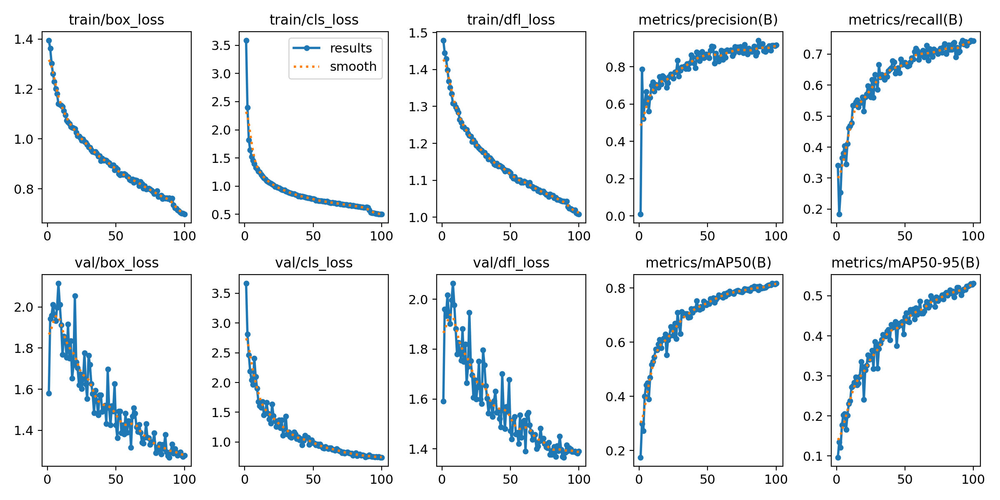

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/results.png', width=900)

The image showcases the training and validation metrics of the final yolo11.

Training Losses:
we could see here that the Train/Box Loss , Train/Cls Loss (Classification Loss) and Train/DFL Loss (Distribution Focal Loss) Showing a consistent downward trend better than the baseline.it suggests the model is becoming better at classifying objects within the predicted bounding boxes.

Validation Losses:
here the Val/Box Loss,Val/Cls Loss and Val/DFL Loss shows similar downward trend as the training loss, but with some variance.
Indicates good generalization but suggests some noise in validation predictions.Val/Cls loss confirms the model is learning to classify objects effectively in unseen data.Val/DFL loss decreases consistently but exhibits more spikes compared to training losses.Suggests room for improvement in model stability.

In [ ]:
f_metrics = final_model.val()
print("final model Metrics:", metrics)

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


val: Scanning /content/Construction-Site-Safety-28/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


                   all        114        697      0.921      0.741      0.817       0.53
               Hardhat         42         79      0.925       0.78      0.878      0.606
                  Mask         19         21          1      0.898      0.935      0.679
            NO-Hardhat         37         69      0.871      0.536      0.666      0.382
               NO-Mask         44         74      0.867      0.622      0.672      0.354
        NO-Safety Vest         56        106       0.96      0.681       0.79       0.51
                Person         84        166      0.921      0.753       0.84      0.558
           Safety Cone         13         44      0.886      0.864       0.88       0.51
           Safety Vest         28         41          1      0.793      0.935      0.622
             machinery         26         55      0.912      0.938       0.95      0.698
               vehicle         16         42       0.87      0.548       0.62       0.38
Speed: 0.1ms preproce



---

| **Metric**         | **Baseline YOLO11** (10 epochs, batch=32) | **Final YOLO Model** (100 epochs, batch=64) | **Improvement**  |
|---------------------|-------------------------------------------|---------------------------------------------|------------------|
| **Precision**       | 0.8449 (84.49%)                          | 0.9213 (92.13%)                             | +7.64%           |
| **Recall**          | 0.6059 (60.59%)                          | 0.7412 (74.12%)                             | +13.53%          |
| **mAP@50**          | 0.6875 (68.75%)                          | 0.8165 (81.65%)                             | +12.90%          |
| **mAP@50-95**       | 0.3636 (36.36%)                          | 0.5298 (52.98%)                             | +16.62%          |
| **Fitness Score**   | 0.3960 (39.60%)                          | 0.5585 (55.85%)                             | +16.25%          |


---




**Precision:**
The final model significantly reduces false positives compared to the baseline (+7.64%). This improvement is likely due to the extended training period (100 epochs) and larger batch size (64), allowing the model to learn more robust feature representations.



---


**Recall:**
The final model detects a larger proportion of true positives, suggesting improved sensitivity (+13.53%). The additional training epochs likely helped the model generalize better, resulting in fewer missed detections.


---
**mAP@50:**
The improvement in mAP@50 indicates the final model is better at detecting objects with a moderate overlap between predicted and ground truth boxes. This demonstrates a clear improvement in overall detection performance (+12.90%).

---

**mAP@50-95:**
The sharp increase in mAP@50-95 highlights the final model’s ability to handle stricter IoU thresholds, suggesting enhanced bounding box localization accuracy and improved performance on smaller or overlapping objects (+16.62%).

---

**Fitness Score:**
The fitness score aggregates the overall performance metrics, and its substantial improvement reflects the consistent gains across all aspects of the model’s performance (+16.25%).

---

**Conclusion:**

The final model demonstrates a significant improvement over the baseline YOLO11, particularly in recall, mAP metrics, and fitness score. These gains highlight the effectiveness of longer training with larger batch sizes, making the final model much more reliable for real-world applications.


**Key Takeaways:**

Impact of Training Duration:
Increasing the number of epochs from 10 to 100 allowed the model to converge more effectively, learning better representations of the data.
Batch Size Influence:
Using a larger batch size (64 vs. 32) likely helped stabilize the gradient updates and led to smoother training, contributing to improved precision and recall.
Significant Gains in Localization (mAP@50-95):
The largest improvement (+16.62%) was in the strict mAP metric, showcasing the final model's ability to localize objects more precisely compared to the baseline.

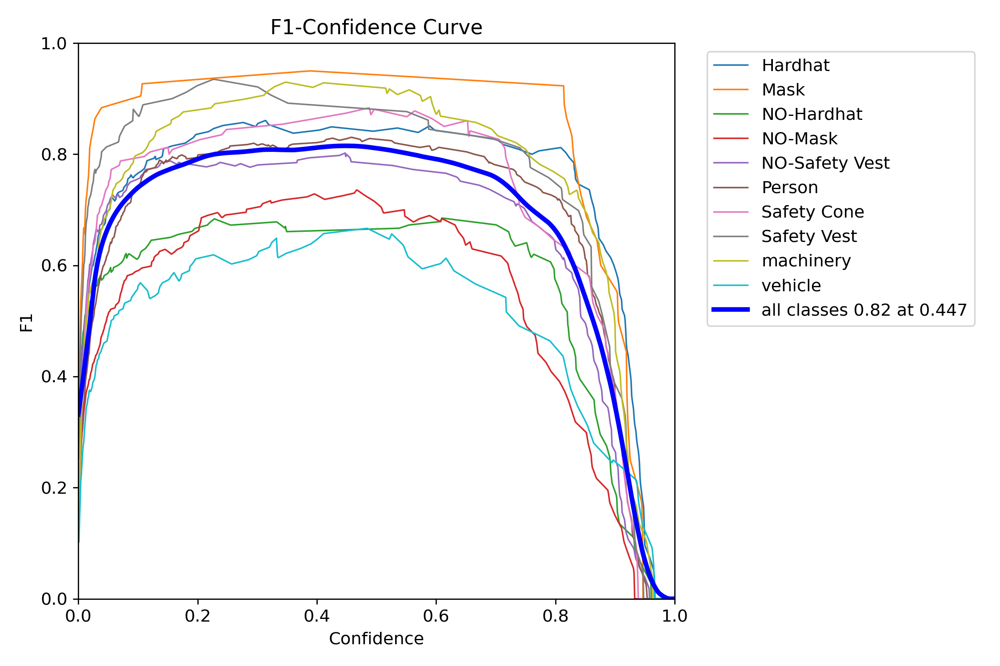

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/F1_curve.png', width=900)

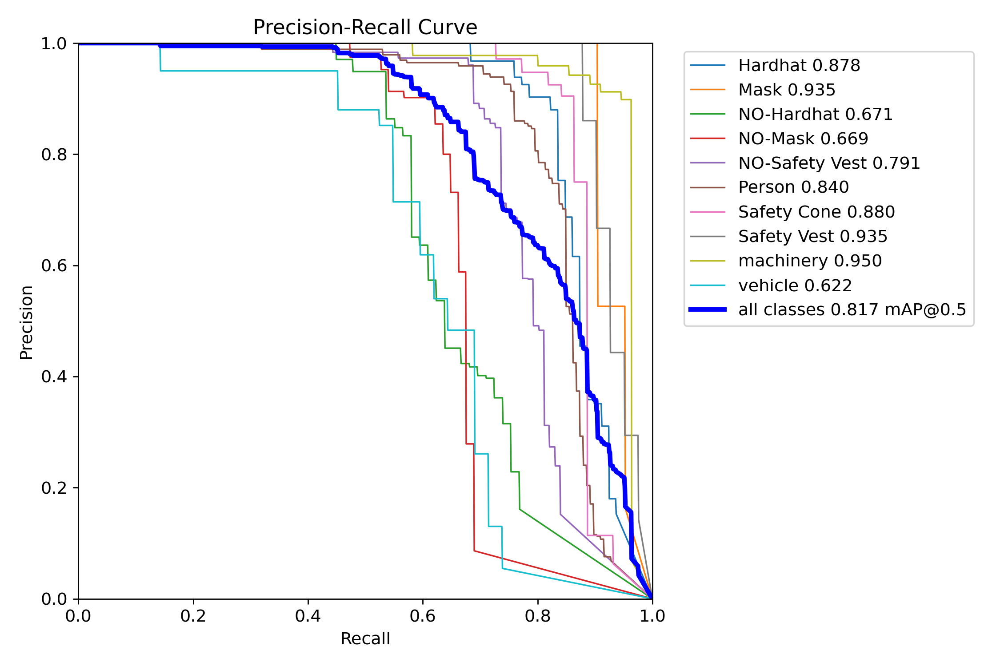

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/PR_curve.png', width=900)

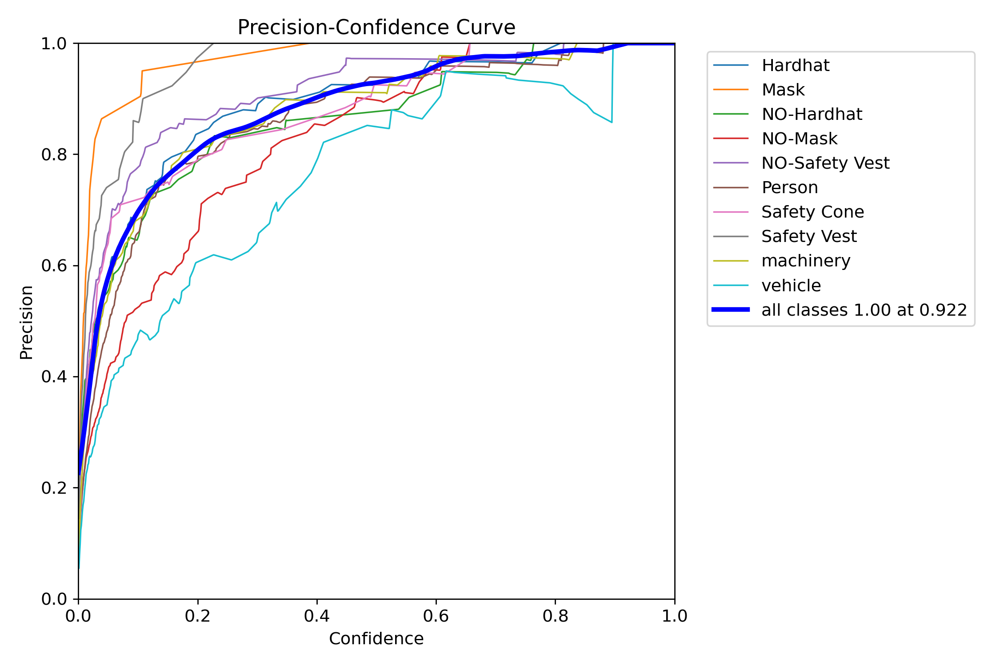

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/P_curve.png', width=900)

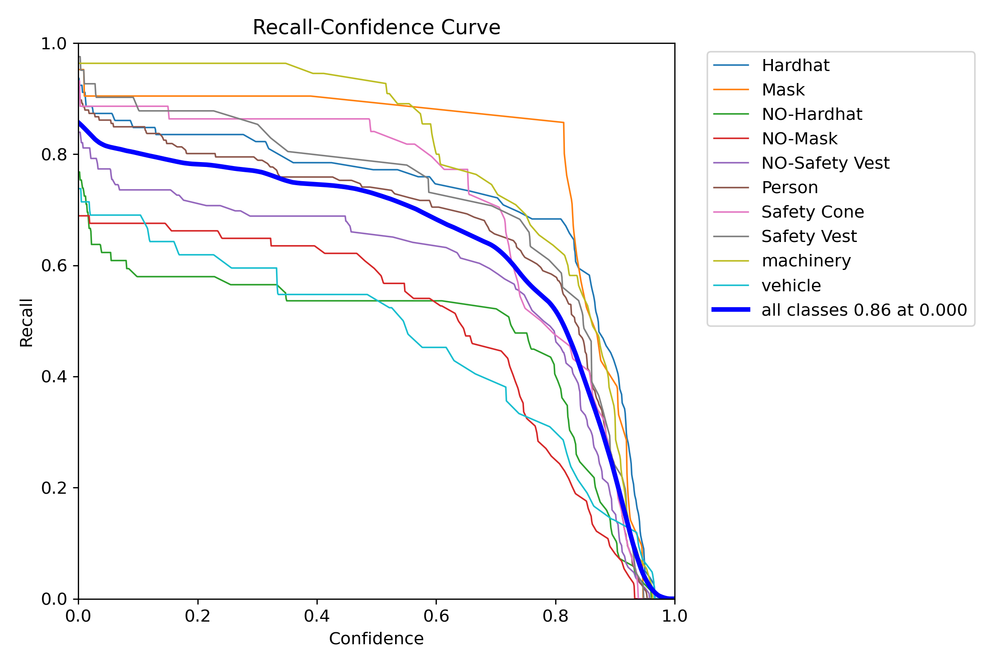

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/R_curve.png', width=900)

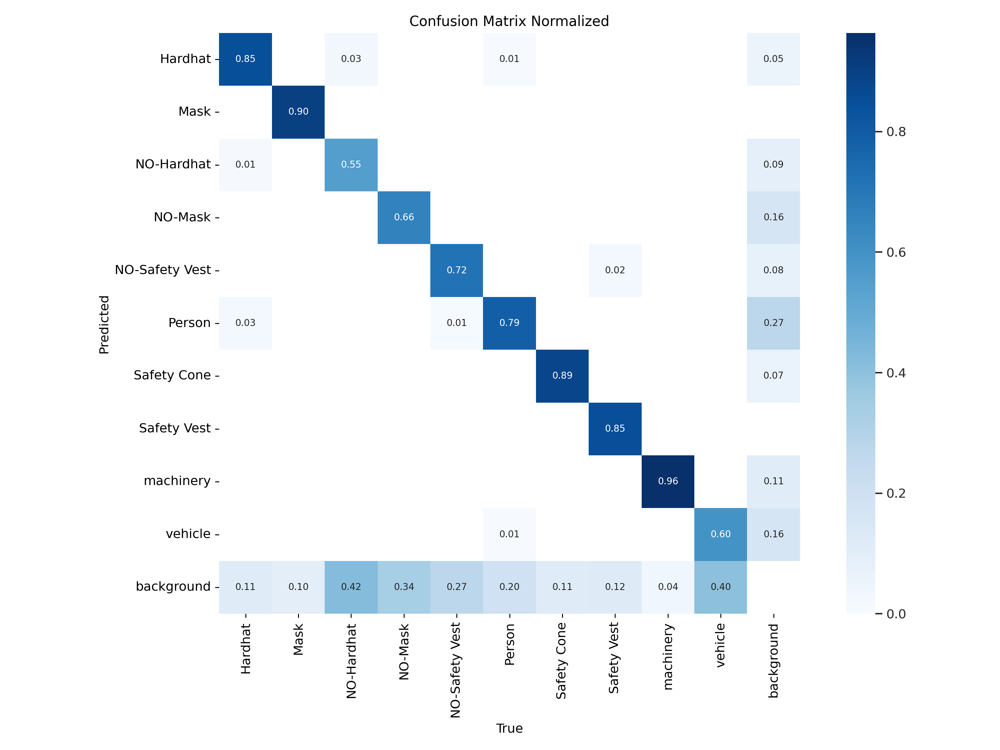

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/confusion_matrix_normalized.png', width=900)

# Data infrence using the final model


---



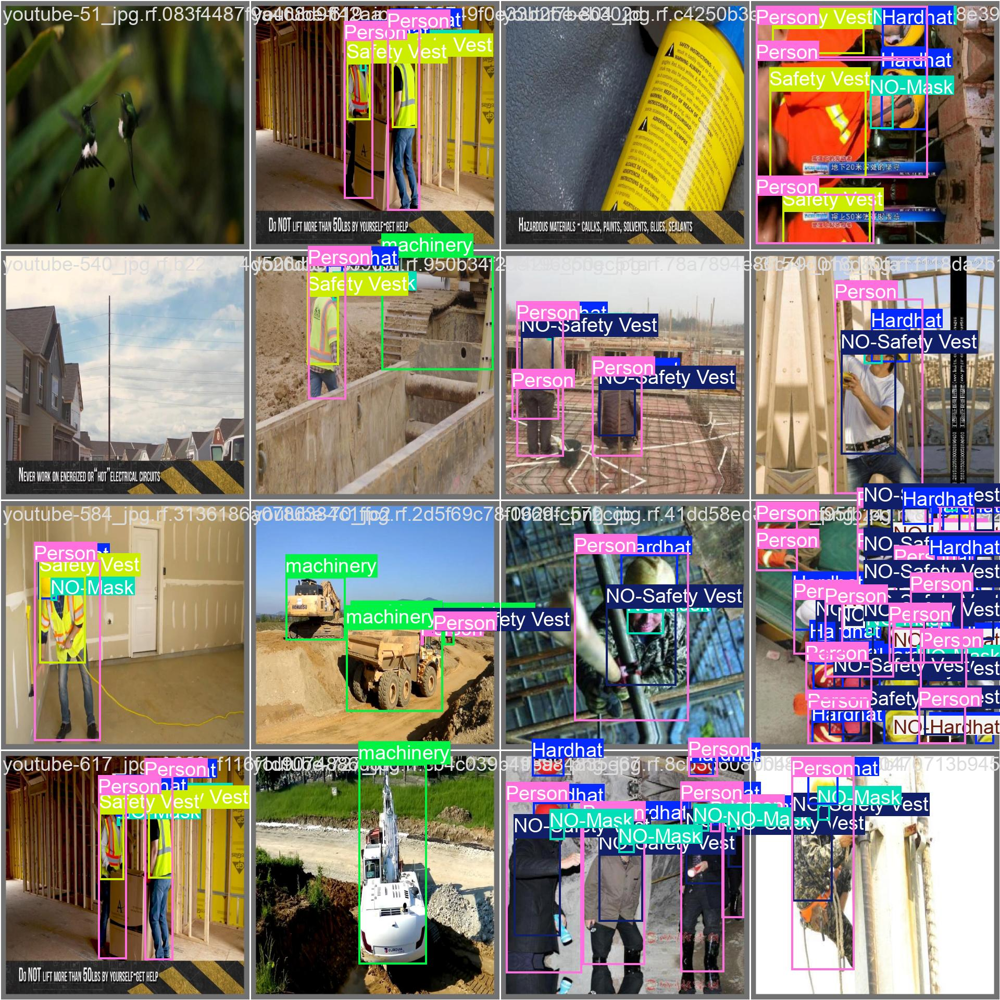

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/val_batch0_labels.jpg', width=900)

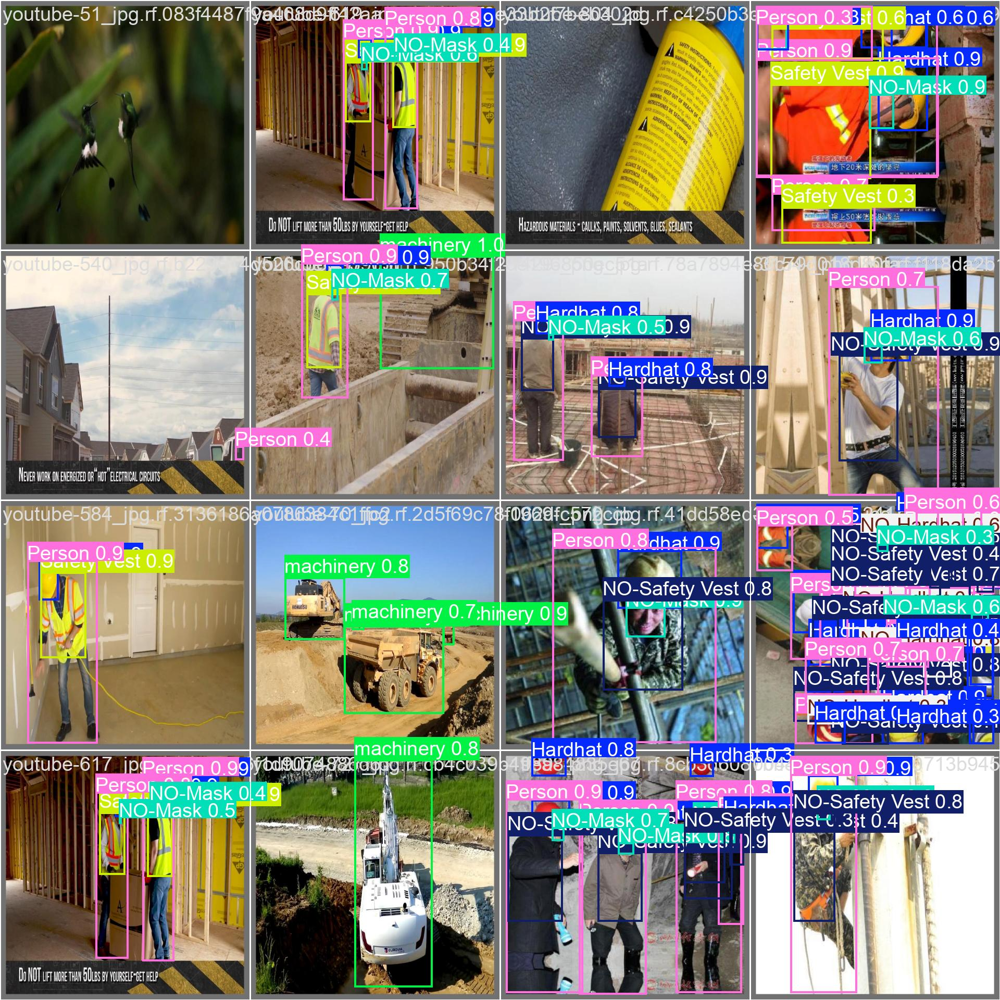

In [ ]:
Image(filename=f'/content/RiakRadar/final_model_training/results/val_batch0_pred.jpg', width=900)